In [1]:
# Data Augmentation
from CVAE import ConditionalVariationalAutoEncoder as CVAE
from imblearn.over_sampling import SMOTE, RandomOverSampler, BorderlineSMOTE, SVMSMOTE, KMeansSMOTE, ADASYN
from sdv.metadata import SingleTableMetadata
from sdv.single_table import CTGANSynthesizer, TVAESynthesizer, GaussianCopulaSynthesizer
from sdv.sampling import Condition
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split
import inspect

from functions import *
from metrics import *
from pipeline import *
import optuna
optuna.logging.set_verbosity(optuna.logging.CRITICAL)
from optuna.visualization import (
    plot_optimization_history,
    plot_param_importances,
    plot_parallel_coordinate,
    plot_contour,
    plot_slice,
)
import shap

import pandas as pd
import numpy as np
import seaborn as sn
import random
import matplotlib.pyplot as plt
from tqdm import tqdm
import time
from collections import Counter
import torch
from torch import Tensor, tensor

# Models
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

import os
import warnings
warnings.filterwarnings("ignore")
os.environ["LOKY_MAX_CPU_COUNT"] = "8"

# Shear Wall Database

In [2]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Shear_Wall_Database.xlsx'
df1 = pd.read_excel(file_path, sheet_name='Database')
df=df1.loc[:, 'FailureMode':]
df.head()

,FailureMode,M/Vlw,lw/tw,"ρvwFy,vw/fc","ρhwFy,hw/fc","ρvbFy,vb/fc","ρhbFy,hb/fc",P/fcAg,Ab/Ag,Section
0,1,1.1,10.714286,0.268879,0.136711,0.348231,0.149140,0.000000,0.0,R
1,1,1.1,10.714286,0.262358,0.133396,0.339785,0.145522,0.102168,0.0,R
2,1,1.1,10.714286,0.346364,0.176108,0.448584,0.192118,0.208187,0.0,R
3,1,1.1,10.714286,0.334023,0.169834,0.432601,0.185273,0.000000,0.0,R
4,1,1.1,10.714286,0.324766,0.165127,0.420612,0.180139,0.101727,0.0,R


In [3]:
df.groupby('FailureMode').size()

FailureMode
1    152
2     96
3    122
4     23
dtype: int64

In [4]:
print_ranges(df)

                  Min       Max
FailureMode         1         4
M/Vlw        0.249869       4.1
lw/tw        4.347826      57.0
ρvwFy,vw/fc       0.0  0.487957
ρhwFy,hw/fc       0.0  0.326964
ρvbFy,vb/fc       0.0  2.645968
ρhbFy,hb/fc       0.0  1.264049
P/fcAg            0.0  0.499402
Ab/Ag             0.0  0.443262
Section             B         R


In [413]:
feature=df.loc[:, df.columns != 'FailureMode']
mapping = {'R': 0, 'B': 1, 'F': 2}
feature['Section'] = feature['Section'].map(mapping)
feature.head()

,M/Vlw,lw/tw,"ρvwFy,vw/fc","ρhwFy,hw/fc","ρvbFy,vb/fc","ρhbFy,hb/fc",P/fcAg,Ab/Ag,Section
0,1.1,10.714286,0.268879,0.136711,0.348231,0.149140,0.000000,0.0,0
1,1.1,10.714286,0.262358,0.133396,0.339785,0.145522,0.102168,0.0,0
2,1.1,10.714286,0.346364,0.176108,0.448584,0.192118,0.208187,0.0,0
3,1.1,10.714286,0.334023,0.169834,0.432601,0.185273,0.000000,0.0,0
4,1.1,10.714286,0.324766,0.165127,0.420612,0.180139,0.101727,0.0,0


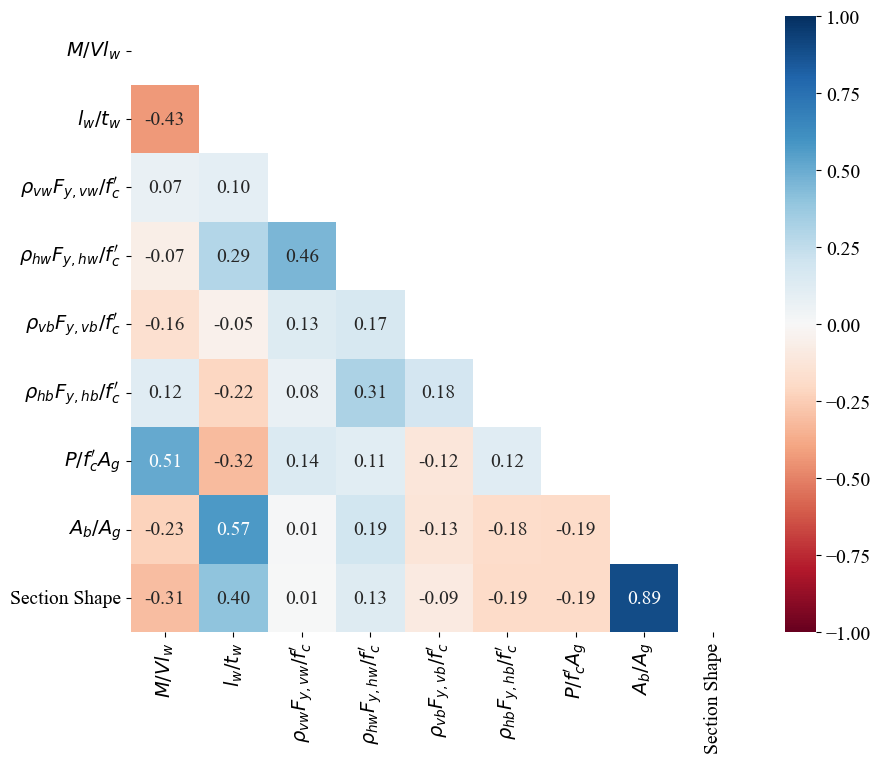

In [414]:
col_names = additional_info['numerical_cols']+['Section']
df_processed = pd.DataFrame(feature, columns=col_names).rename(columns=rename_dict)

corr_matrix = df_processed.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='RdBu', square=True, vmin=-1, vmax=1)
plt.savefig(f"plots/correlation.eps", bbox_inches='tight', dpi=600)
plt.savefig(f"plots/correlation.tiff", bbox_inches='tight', dpi=600)
plt.show()

# Pre-processing Investigation

In [5]:
# feature = df.loc[:, df.columns != 'FailureMode']
# output = df['FailureMode'] - 1

# scaler_list = ['none', 'standard']
# encoder_list = ['ordinal', 'onehot']

# results = []

# skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

# for scaler in scaler_list:
#     for encoder in encoder_list:
#         for model_name, model_cls in model_space.items():
#             fold_accuracies = []
#             fold_f1s = []

#             for train_idx, test_idx in skf.split(feature, output):
#                 X_train_df, X_test_df = feature.iloc[train_idx], feature.iloc[test_idx]
#                 y_train, y_test = output.iloc[train_idx], output.iloc[test_idx]

#                 X_train, _, info = process_dataframe(X_train_df, y_train, scaler, encoder)
#                 X_test, *_ = process_dataframe(X_test_df, y_test, scaler, encoder, existing_info=info)

#                 if model_name == 'CB':
#                     init_params = {"verbose": 0}
#                 elif model_name == 'LGB':
#                     init_params = {"verbose": -1}
#                 else:
#                     init_params = {}
                
#                 # Add random_state if the model supports it
#                 if "random_state" in inspect.signature(model_cls.__init__).parameters:
#                     init_params["random_state"] = 0
                
#                 model = model_cls(**init_params)

#                 model.fit(X_train, y_train)
#                 y_pred = model.predict(X_test)

#                 fold_accuracies.append(accuracy_score(y_test, y_pred))
#                 fold_f1s.append(f1_score(y_test, y_pred, average='macro'))

#             results.append({
#                 'Model': model_name,
#                 'Scaler': scaler,
#                 'Encoder': encoder,
#                 'Accuracy': np.mean(fold_accuracies),
#                 'F1 Score': np.mean(fold_f1s)
#             })

# results_df = pd.DataFrame(results)

In [6]:
# from pandas.api.types import CategoricalDtype

# def style_group(group):
#     # Create empty style DataFrame
#     styles = pd.DataFrame('', index=group.index, columns=group.columns)

#     # Find max F1 and Accuracy within group
#     max_f1 = group['F1 Score'].max()
#     max_acc = group['Accuracy'].max()

#     # Bold the max F1 and Accuracy values
#     styles.loc[group['F1 Score'] == max_f1, 'F1 Score'] = 'font-weight: bold;'
#     styles.loc[group['Accuracy'] == max_acc, 'Accuracy'] = 'font-weight: bold;'

#     return styles

# model_order = list(model_space.keys())
# cat_type = CategoricalDtype(categories=model_order, ordered=True)
# results_df['Model'] = results_df['Model'].astype(cat_type)
# cat_type = CategoricalDtype(categories=scaler_list, ordered=True)
# results_df['Scaler'] = results_df['Scaler'].astype(cat_type)
# cat_type = CategoricalDtype(categories=encoder_list, ordered=True)
# results_df['Encoder'] = results_df['Encoder'].astype(cat_type)

# results_df = results_df.sort_values(by=['Model', 'Scaler', 'Encoder']) # 
# results_df.set_index(['Model', 'Scaler', 'Encoder'], inplace=True) # 

# # Apply group-wise styling and add borders/padding
# styled_df = results_df.style \
#     .format({
#         'Accuracy': '{:.3f}',
#         'F1 Score': '{:.3f}'
#     }) \
#     .apply(lambda df: df.groupby('Model', group_keys=False).apply(style_group), axis=None) \
#     .set_table_styles([{
#         'selector': 'th, td',
#         'props': [('border', '1px solid black'), ('padding', '4px')]
#     }])


# display(styled_df)

# Generate Augmented dataset

In [7]:
feature=df.loc[:, df.columns != 'FailureMode']
output=df['FailureMode'] - 1
class_names = ["F", "FS", "S", "SL"]

feature_tensor, label_tensor, additional_info = process_dataframe(feature, output, scaler = 'standard')

print("Processed Feature:")
print(feature_tensor)

print("Processed Label:")
print(label_tensor)

data = additional_info
save_results(data, "preprocess.pkl")

Processed Feature:
[[-0.4065302  -0.45786828  2.5459094  ...  0.          0.
   1.        ]
 [-0.4065302  -0.45786828  2.4566128  ...  0.          0.
   1.        ]
 [-0.4065302  -0.45786828  3.606911   ...  0.          0.
   1.        ]
 ...
 [ 0.86010826 -0.6169247  -0.42569113 ...  0.          0.
   1.        ]
 [-0.5472678  -0.15620948 -0.36890963 ...  0.          0.
   1.        ]
 [-0.5472678  -0.15620948 -0.4049079  ...  0.          0.
   1.        ]]
Processed Label:
[[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 ...
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]


In [8]:
additional_info

{'numerical_cols': ['M/Vlw',
  'lw/tw',
  'ρvwFy,vw/fc',
  'ρhwFy,hw/fc',
  'ρvbFy,vb/fc',
  'ρhbFy,hb/fc',
  'P/fcAg',
  'Ab/Ag'],
 'categorical_cols': ['Section'],
 'selected_scaler': StandardScaler(),
 'encoders': [OneHotEncoder(handle_unknown='ignore', sparse_output=False)],
 'encoder_type': 'onehot',
 'label_scaler': OneHotEncoder(handle_unknown='ignore', sparse_output=False),
 'label_dim': 4,
 'len_numerical': 8,
 'len_ohes': [3]}

In [388]:
df_processed.dtypes

$M/Vl_{w}$                          float32
$l_{w}/t_{w}$                       float32
$\rho_{vw}F_{y,vw}/f_{c}^\prime$    float32
$\rho_{hw}F_{y,hw}/f_{c}^\prime$    float32
$\rho_{vb}F_{y,vb}/f_{c}^\prime$    float32
$\rho_{hb}F_{y,hb}/f_{c}^\prime$    float32
$P/f_{c}^\prime A_{g}$              float32
$A_{b}/A_{g}$                       float32
Barbell                             float32
Flanged                             float32
Rectangular                         float32
dtype: object

In [9]:
metadata = SingleTableMetadata()
metadata.detect_from_dataframe(df)

In [10]:
def resample_sdv_models(model, train_df, label_col, additional_info, additional_sample = 0):
    model.fit(train_df)

    # Count class occurrences
    class_counts = train_df[label_col].value_counts()
    max_count = class_counts.max()
    synthetic_data = []
    # Generate synthetic samples per class
    for label_value, count in class_counts.items():
        if count < max_count:
            n_to_generate = max_count - count + additional_sample
            condition = Condition(
                num_rows=n_to_generate,
                column_values={label_col: label_value}
            )
            samples = model.sample_from_conditions(conditions=[condition])
            synthetic_data.append(samples)

    if synthetic_data:
        df_synth = pd.concat(synthetic_data, ignore_index=True)
        df_combined = pd.concat([train_df, df_synth], ignore_index=True)
    else:
        df_combined = train_df.copy()

    # Separate features and labels
    y_balanced = df_combined[label_col].to_numpy()
    X_balanced = df_combined.drop(columns=[label_col])

    # preprocess it again
    feature_processed, *_ = process_dataframe(X_balanced, None, existing_info=additional_info)
    
    return feature_processed, y_balanced

In [11]:
X = feature_tensor  # already numpy
y_label = label_tensor  # already numpy
y = output.to_numpy()  # assumed to be numpy already

N_fold = 20
save_path = "folds.pkl"

if os.path.exists(save_path):
    all_folds_dict = load_results(filename=save_path)
else:
    all_folds_dict = {}

required_methods = {"regular", "smote", "cvae", "random", "adasyn", "ctgan", "gcs"}
existing_methods = set(all_folds_dict.keys())
missing_methods = required_methods - existing_methods

if not missing_methods:
    print("All folds already present.")
else:
    indices = np.arange(len(X))
    train_idx, test_idx = train_test_split(indices, test_size=0.2, random_state=0)

    X_train, y_train_label, y_train = X[train_idx], y_label[train_idx], y[train_idx]
    X_test, y_test = X[test_idx], y[test_idx]
    train_df = df.iloc[train_idx]
    label_col = 'FailureMode'
    train_df[label_col] = train_df[label_col] - 1

    if "regular" in missing_methods:
        all_folds_dict["regular"] = [(X_train, y_train, X_test, y_test)] * N_fold

    if "smote" in missing_methods:
        smote = SMOTE(random_state=0)
        X_smote, y_smote = smote.fit_resample(X_train, y_train)
        all_folds_dict["smote"] = [(X_smote, y_smote, X_test, y_test)] * N_fold

    if "random" in missing_methods:
        ros = RandomOverSampler(random_state=0)
        X_ros, y_ros = ros.fit_resample(X_train, y_train)
        all_folds_dict["random"] = [(X_ros, y_ros, X_test, y_test)] * N_fold

    if "adasyn" in missing_methods:
        adasyn = ADASYN(random_state=0, sampling_strategy='minority')
        X_adasyn, y_adasyn = adasyn.fit_resample(X_train, y_train)
        all_folds_dict["adasyn"] = [(X_adasyn, y_adasyn, X_test, y_test)] * N_fold

    if "cvae" in missing_methods:
        set_random_seed(0)
        label_scaler = additional_info['label_scaler']
        label_dim = additional_info['label_dim']
        layers_dim = [128, 64, 32, 3]
        batch_size = 32
        epochs = 500
        learning_rate = 5e-3

        cvae = CVAE(len_numerical, len_ohes, label_dim,
                    layers_dim=layers_dim, batch_norm=True, activation='relu')
        X_train_tensor, X_test_tensor = tensor(X_train), tensor(X_test)
        y_train_tensor, y_train_label_tensor, y_test_tensor = tensor(y_train), tensor(y_train_label), tensor(y_test)
        cvae.train_model(X_train_tensor, y_train_label_tensor, lr=learning_rate, batch_size=batch_size,
                         n_iter=epochs, beta_kl=0.5, beta_rec=1.0)
        X_cvae, y_cvae = cvae.resample(X_train_tensor, y_train_label_tensor, label_scaler)
        all_folds_dict["cvae"] = [(X_cvae, y_cvae, X_test, y_test)] * N_fold

    if "ctgan" in missing_methods:
        ctgan = CTGANSynthesizer(metadata)
        X_ctgan, y_ctgan = resample_sdv_models(ctgan, train_df, label_col, additional_info)
        all_folds_dict["ctgan"] = [(X_ctgan, y_ctgan, X_test, y_test)] * N_fold

    if "gcs" in missing_methods:
        gcs = GaussianCopulaSynthesizer(metadata)
        X_gcs, y_gcs = resample_sdv_models(gcs, train_df, label_col, additional_info)
        all_folds_dict["gcs"] = [(X_gcs, y_gcs, X_test, y_test)] * N_fold

    save_results(all_folds_dict, filename=save_path)
    print("Missing folds added and saved.")

All folds already present.


# Pipeline

Running NB on regular folds


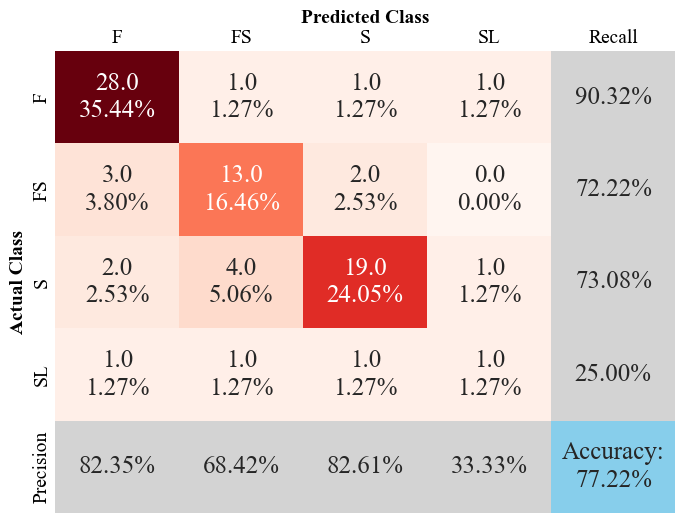

Running NB on random folds


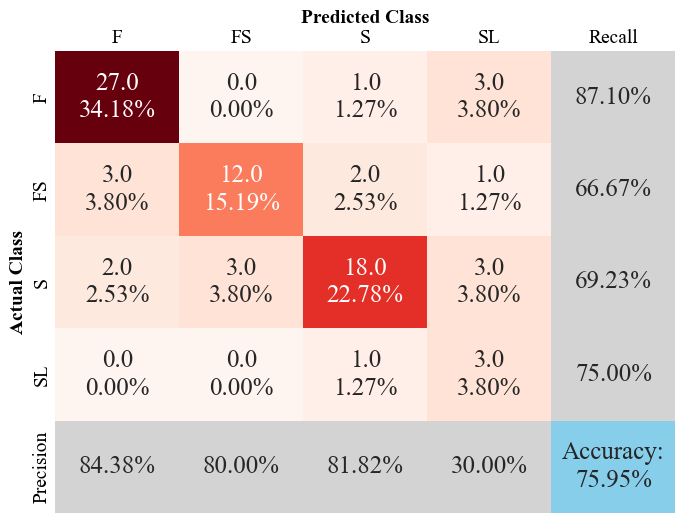

Running NB on smote folds


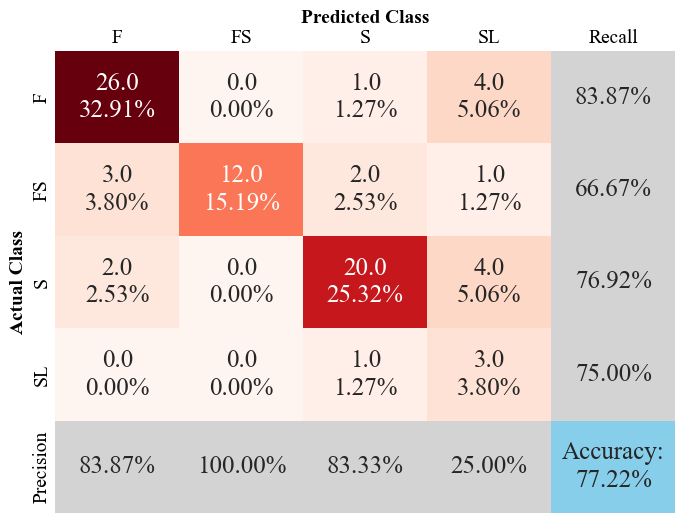

Running NB on adasyn folds


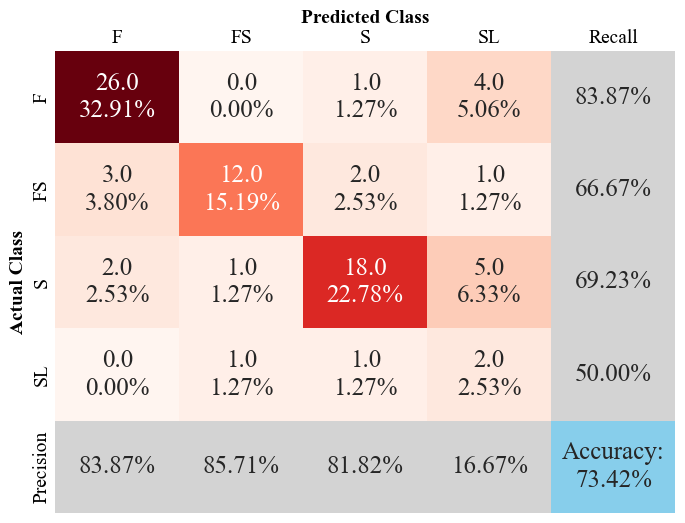

Running NB on ctgan folds


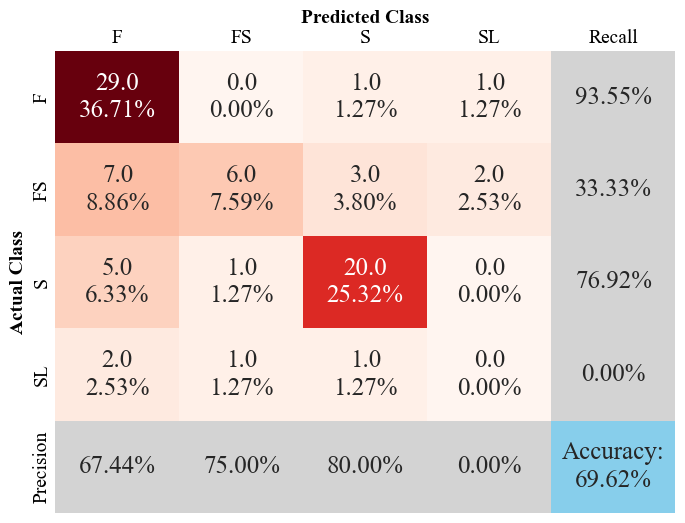

Running NB on cvae folds


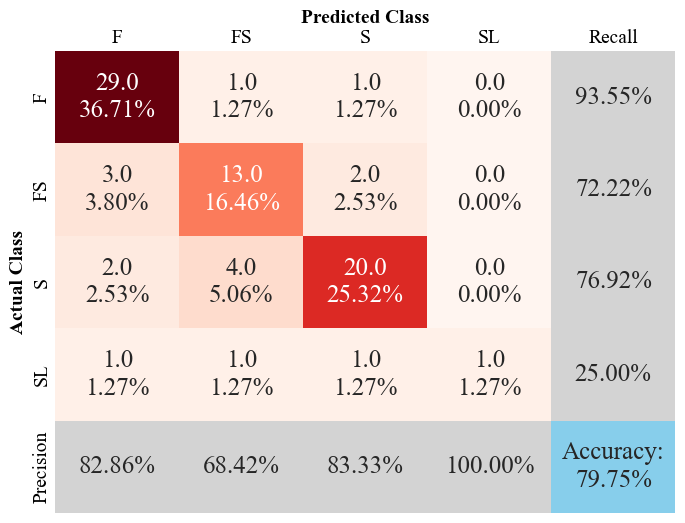

Running DT on regular folds


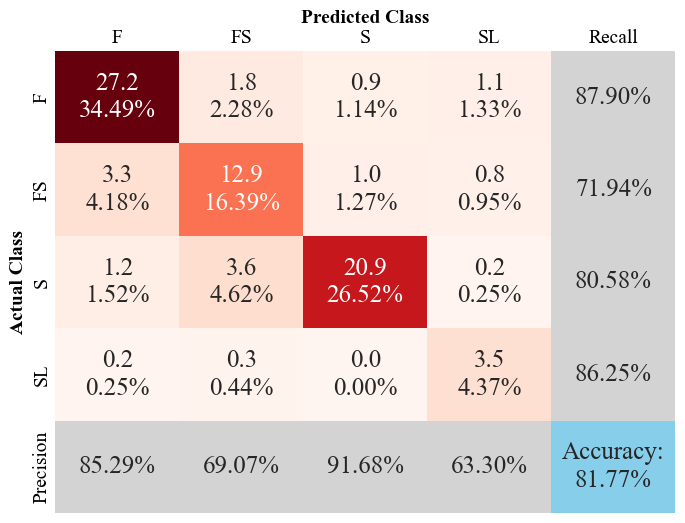

Running DT on random folds


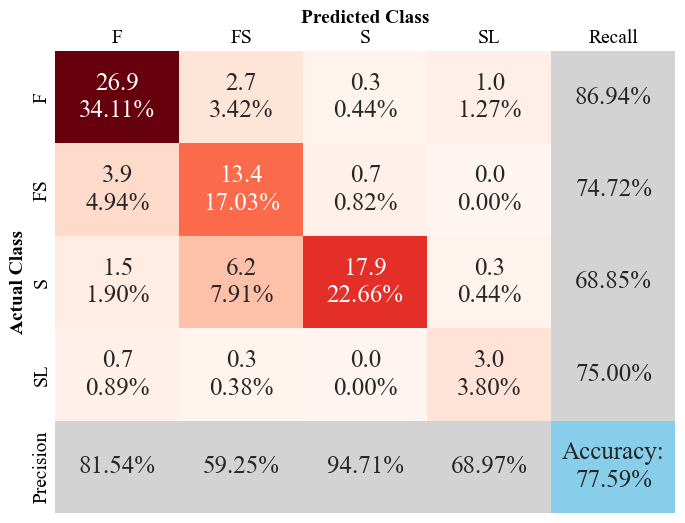

Running DT on smote folds


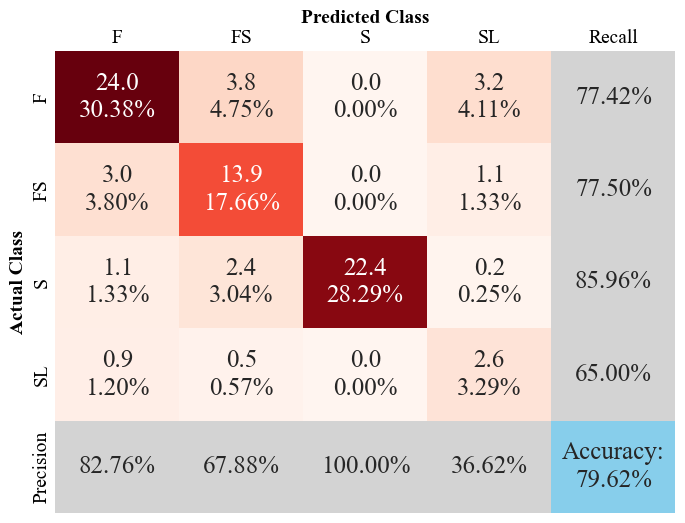

Running DT on adasyn folds


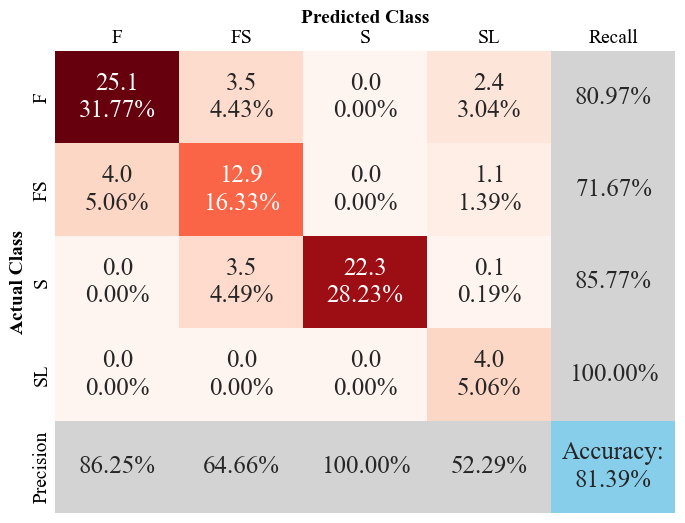

Running DT on ctgan folds


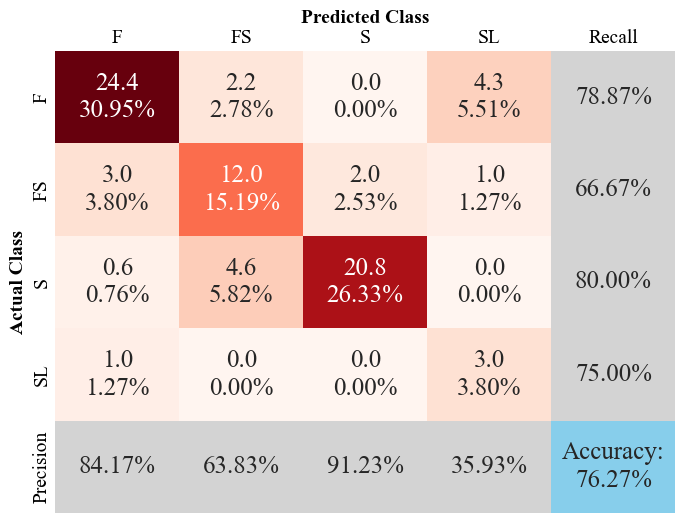

Running DT on cvae folds


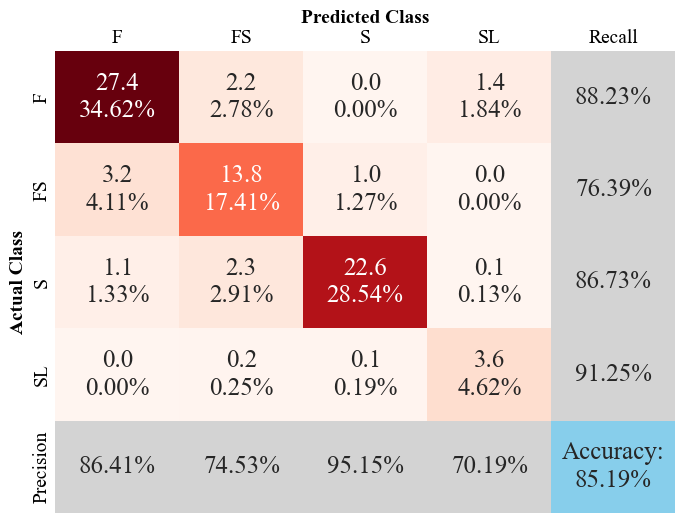

Running MLP on regular folds


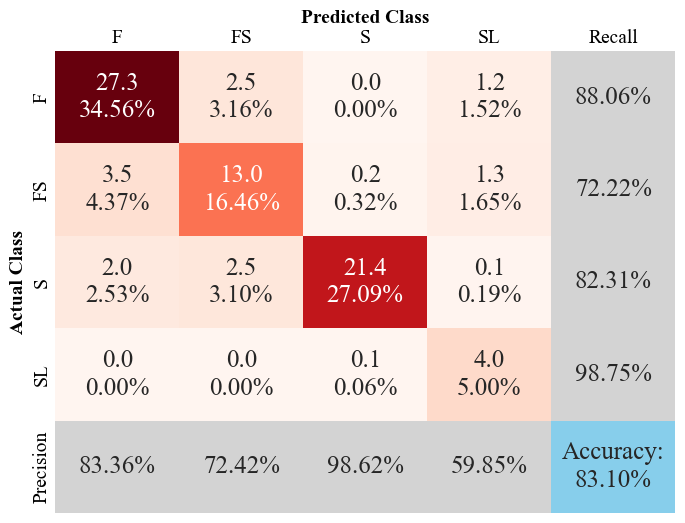

Running MLP on random folds


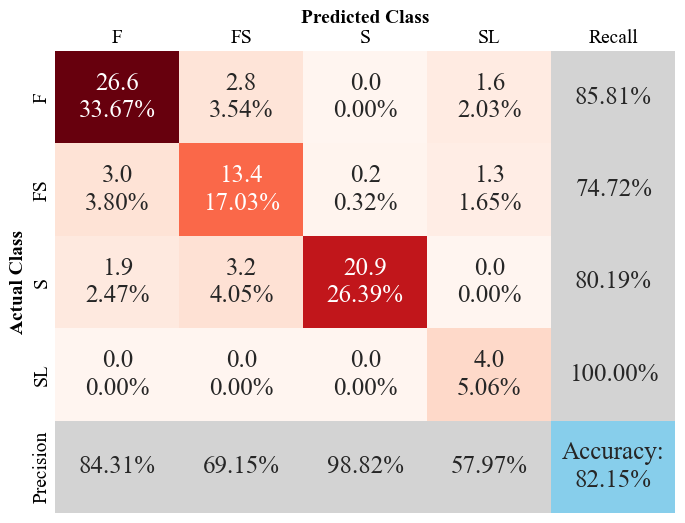

Running MLP on smote folds


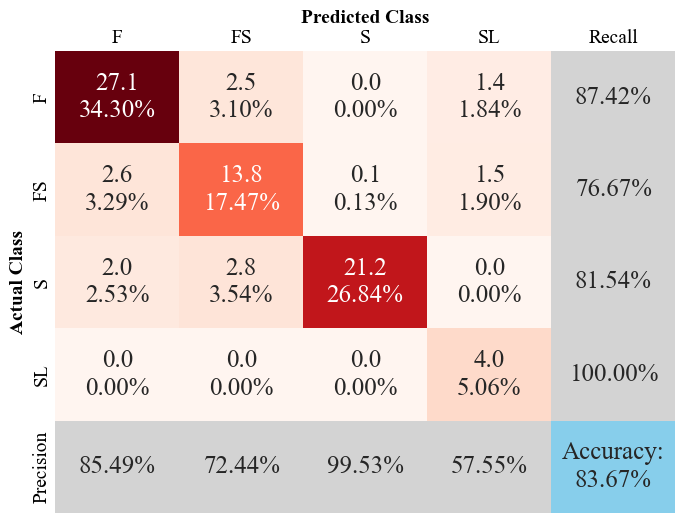

Running MLP on adasyn folds


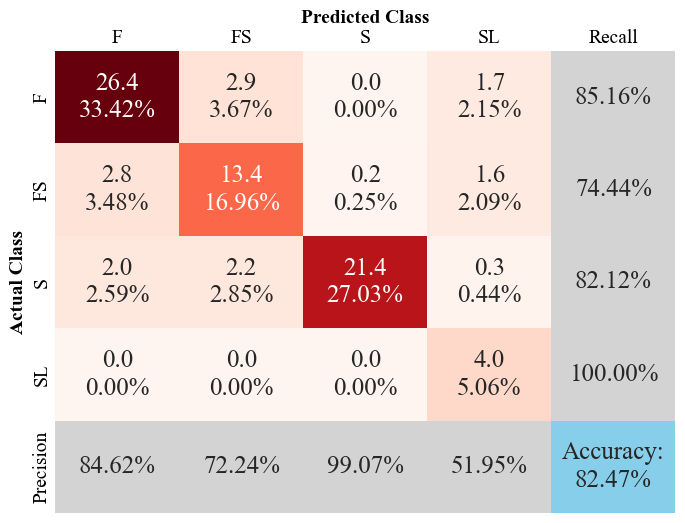

Running MLP on ctgan folds


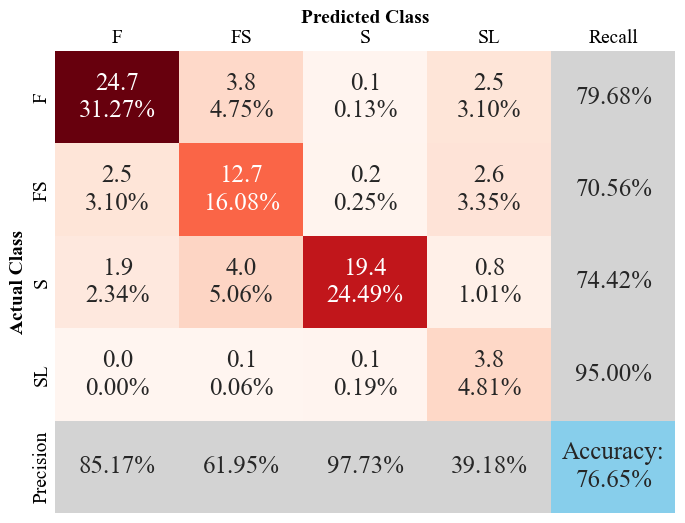

Running MLP on cvae folds


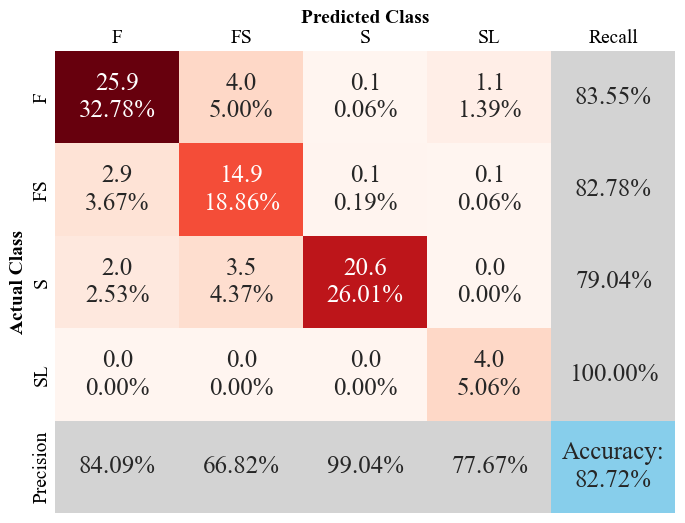

Running RF on regular folds


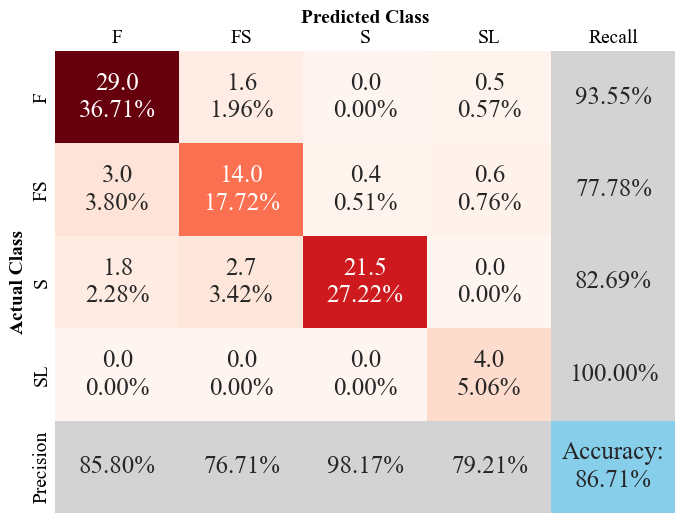

Running RF on random folds


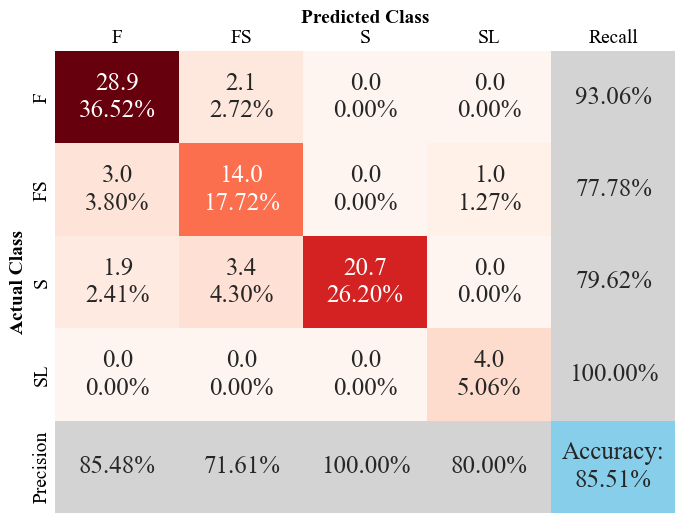

Running RF on smote folds


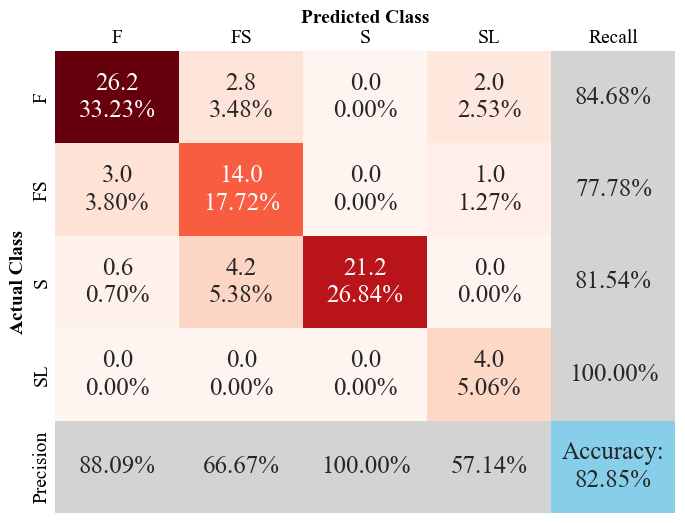

Running RF on adasyn folds


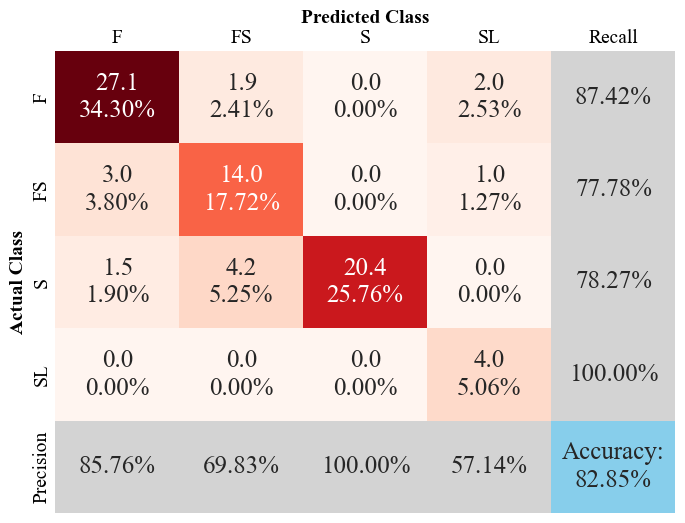

Running RF on ctgan folds


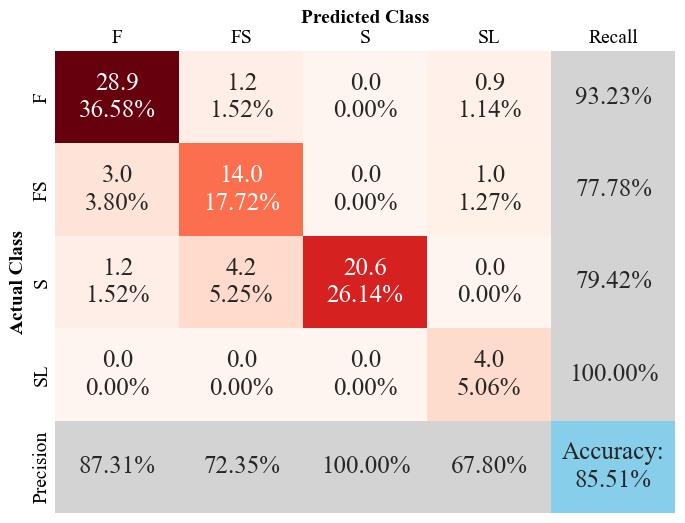

Running RF on cvae folds


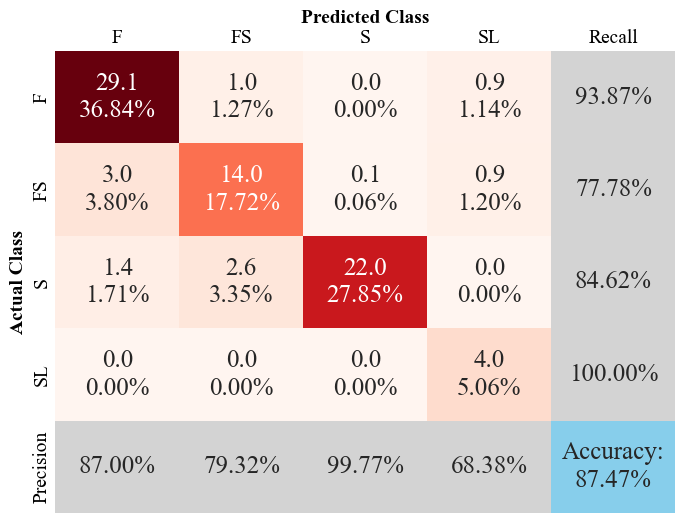

Running ET on regular folds


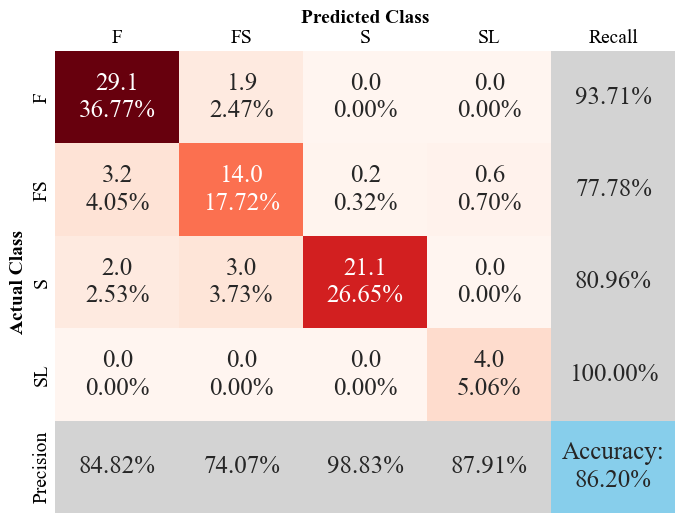

Running ET on random folds


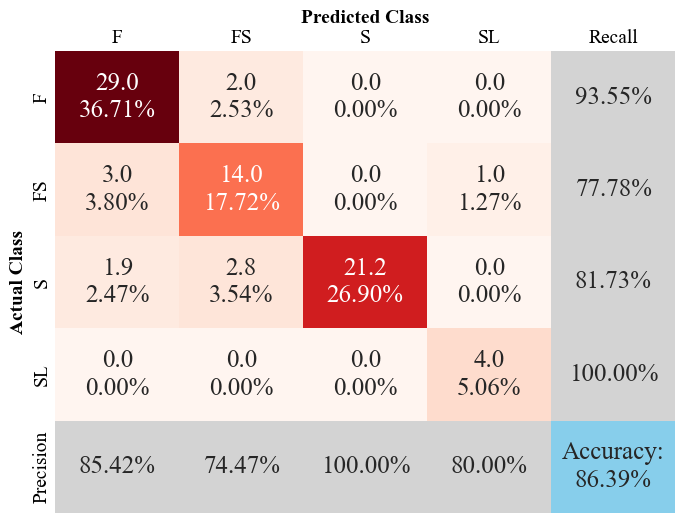

Running ET on smote folds


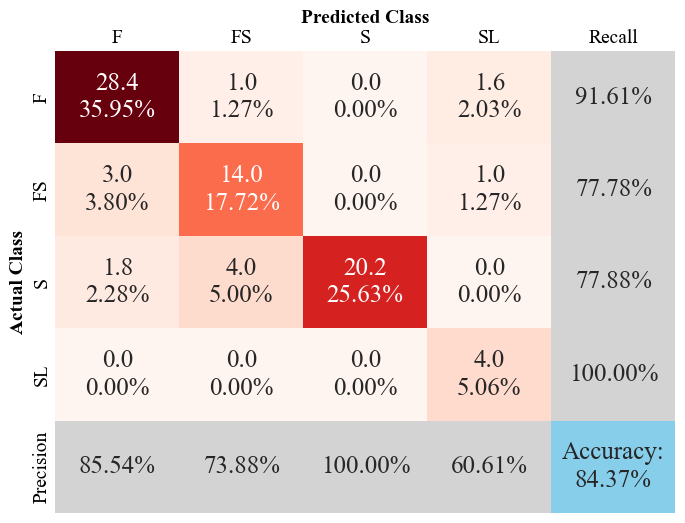

Running ET on adasyn folds


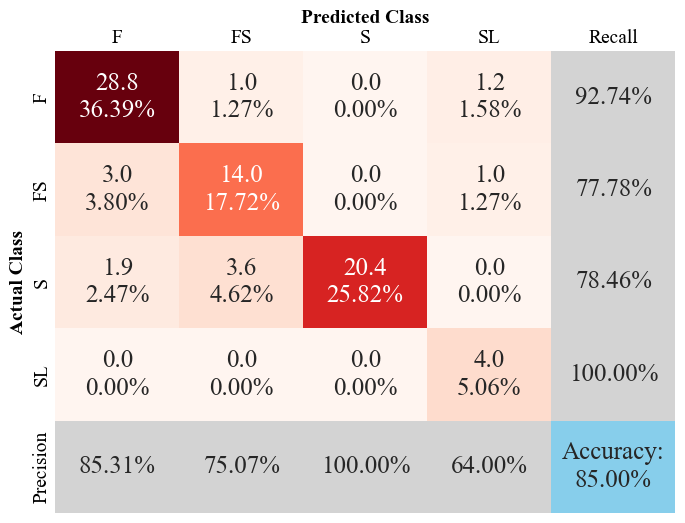

Running ET on ctgan folds


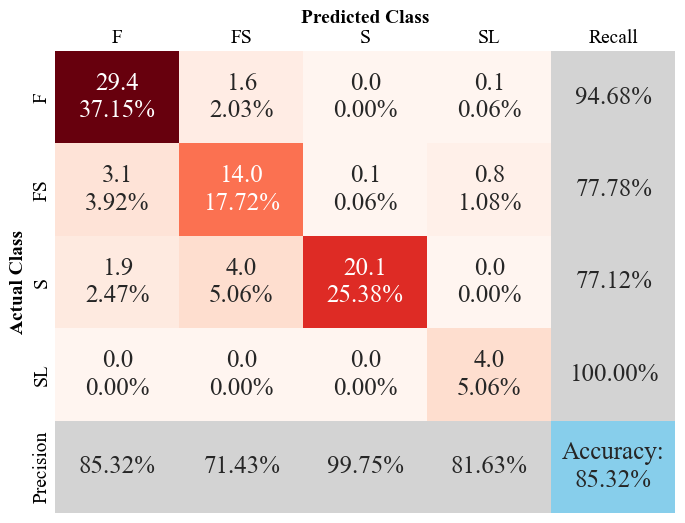

Running ET on cvae folds


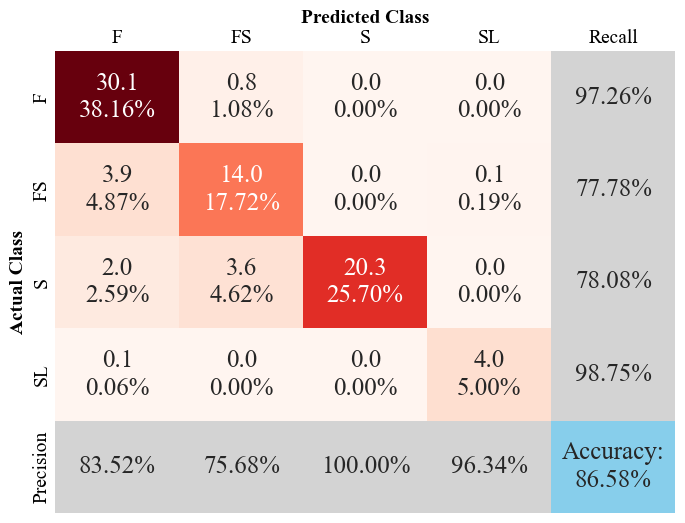

Running XGB on regular folds


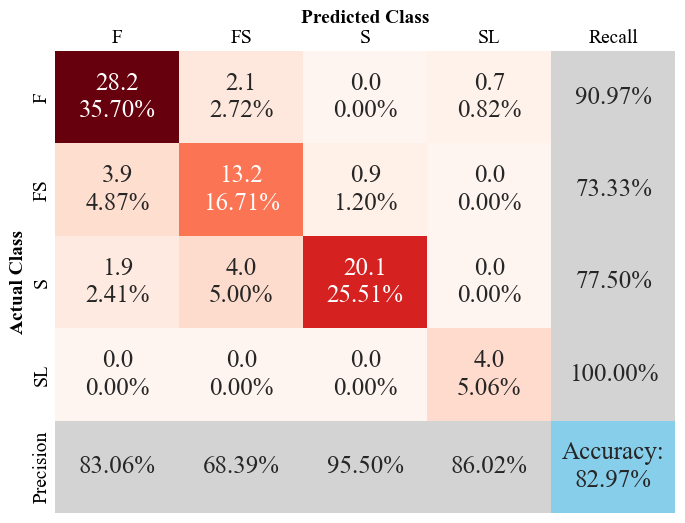

Running XGB on random folds


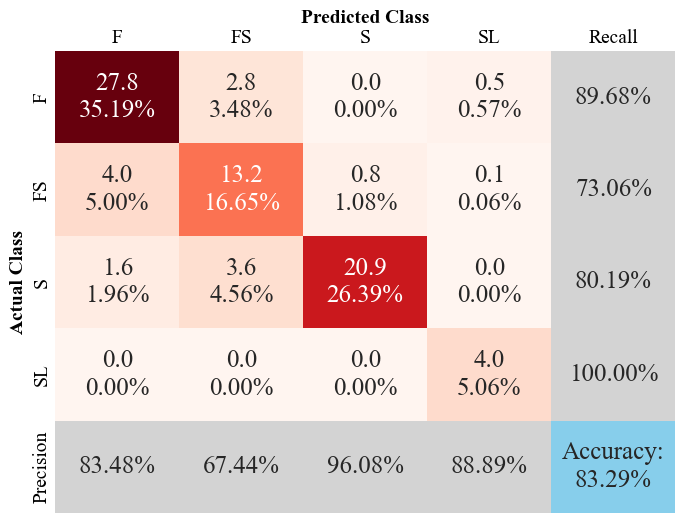

Running XGB on smote folds


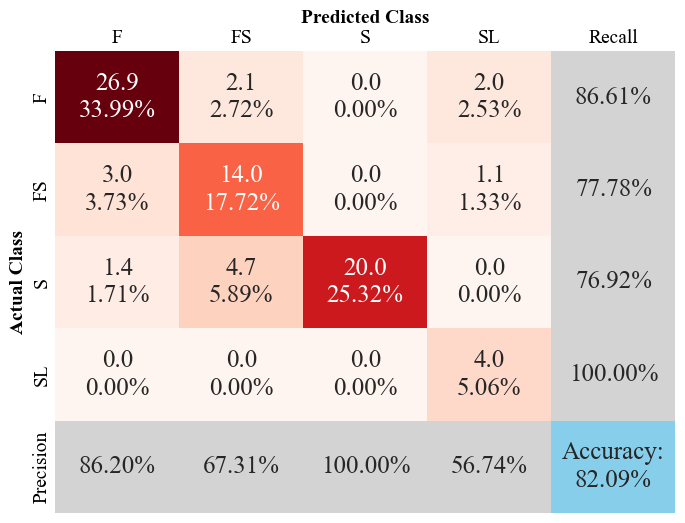

Running XGB on adasyn folds


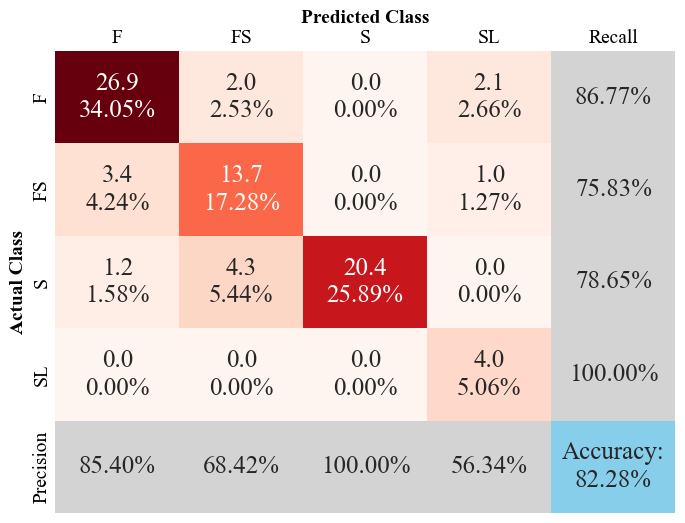

Running XGB on ctgan folds


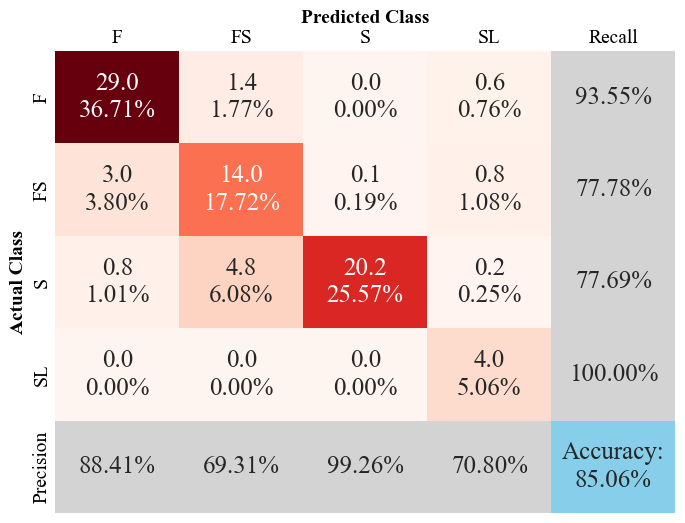

Running XGB on cvae folds


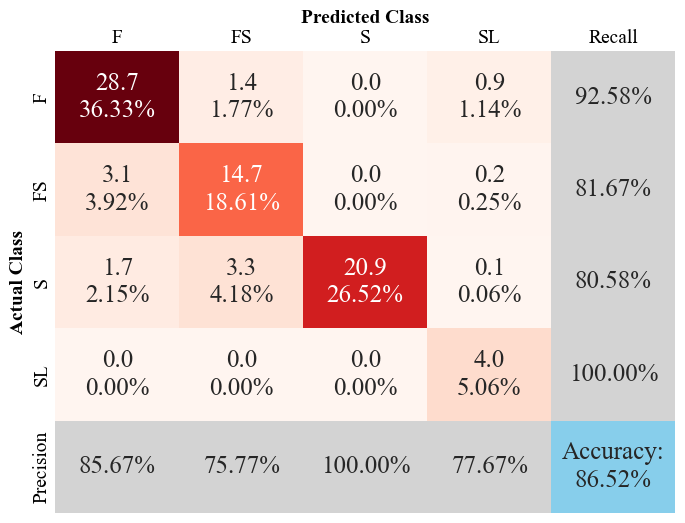

Running LGB on regular folds


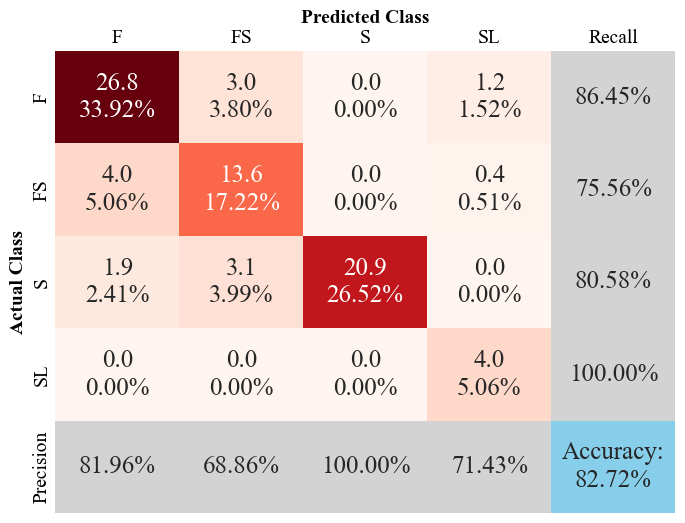

Running LGB on random folds


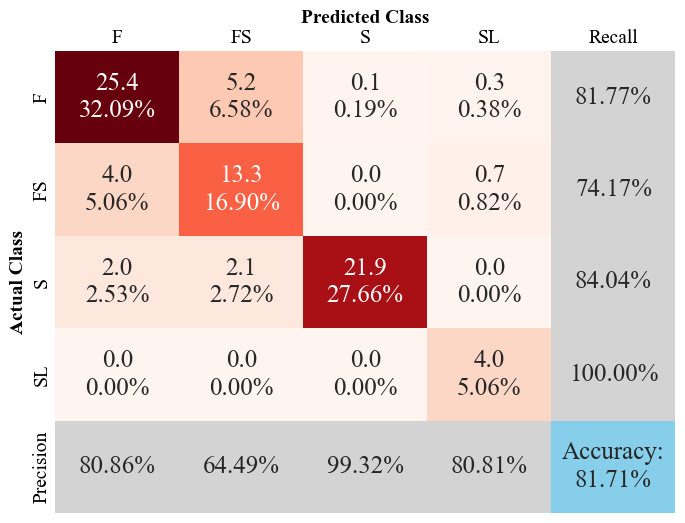

Running LGB on smote folds


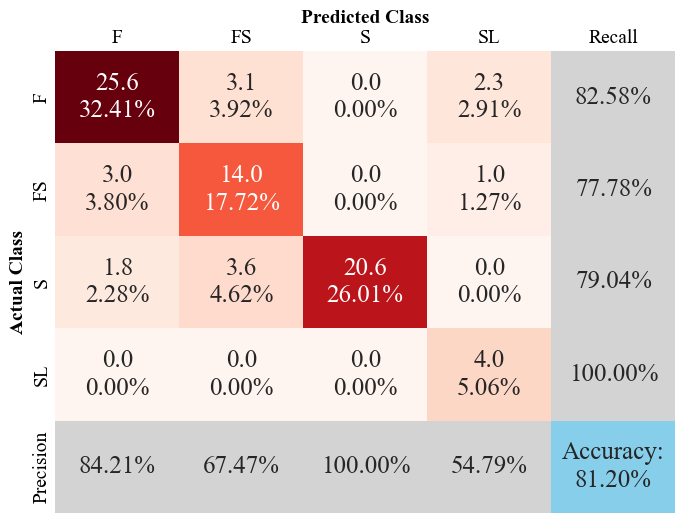

Running LGB on adasyn folds


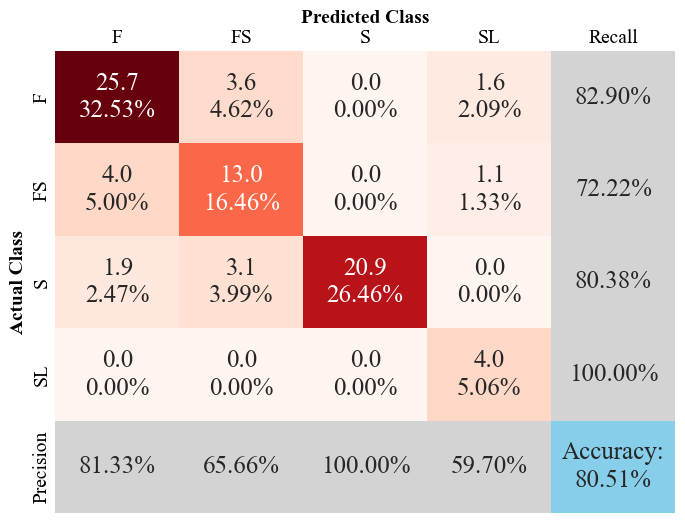

Running LGB on ctgan folds


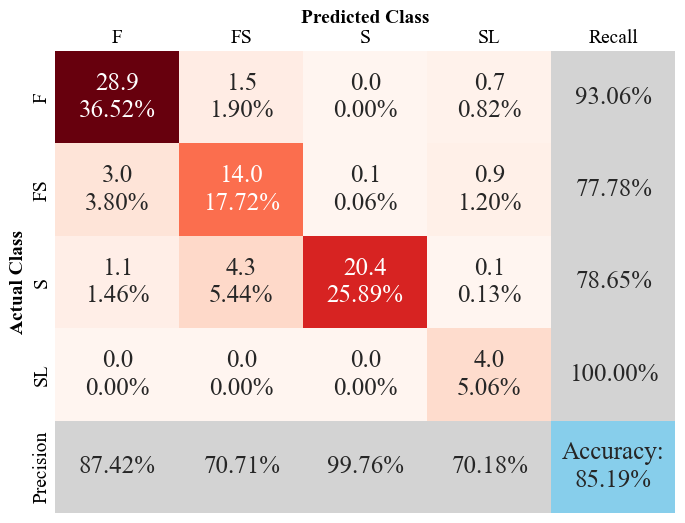

Running LGB on cvae folds


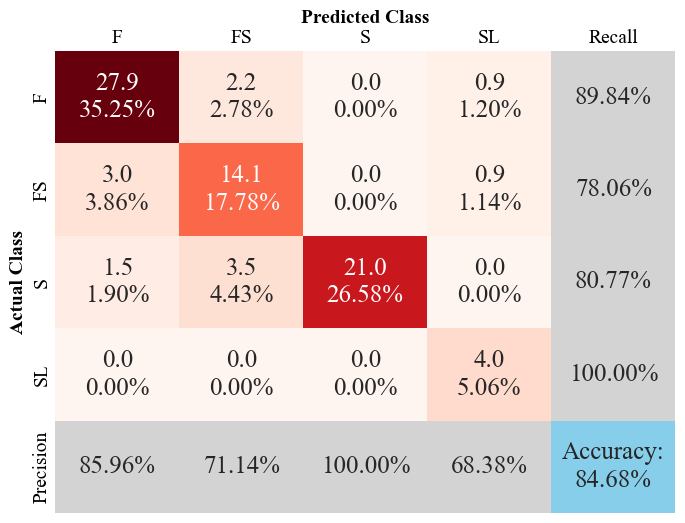

Running CB on regular folds


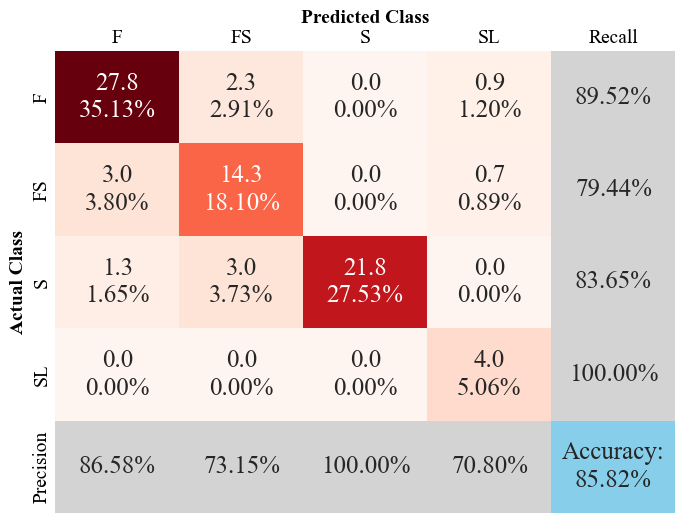

Running CB on random folds


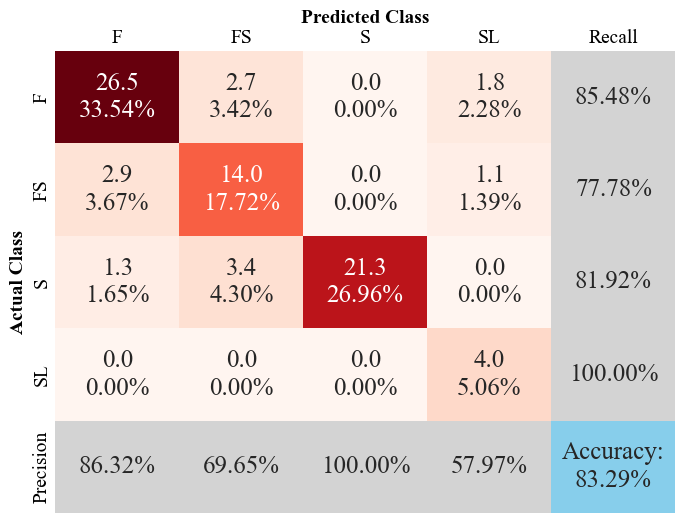

Running CB on smote folds


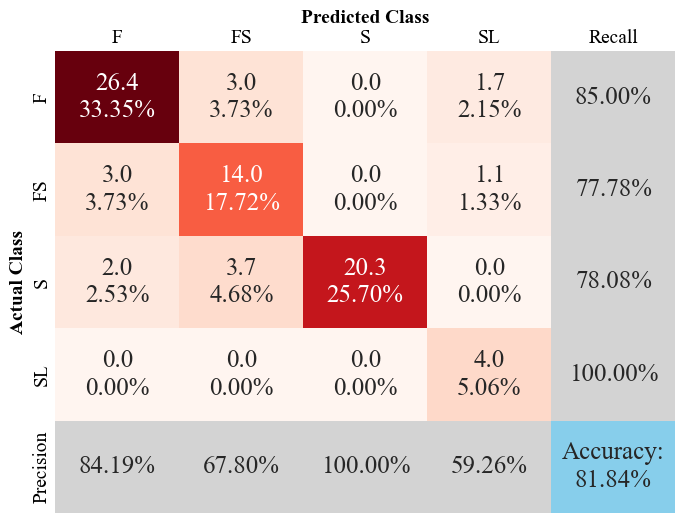

Running CB on adasyn folds


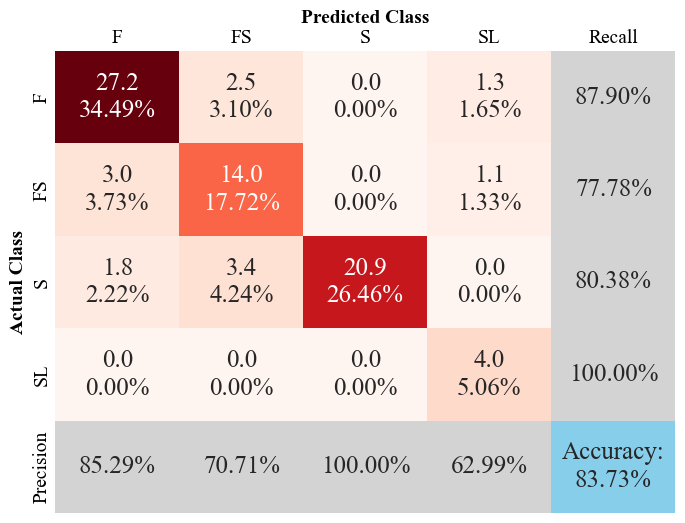

Running CB on ctgan folds


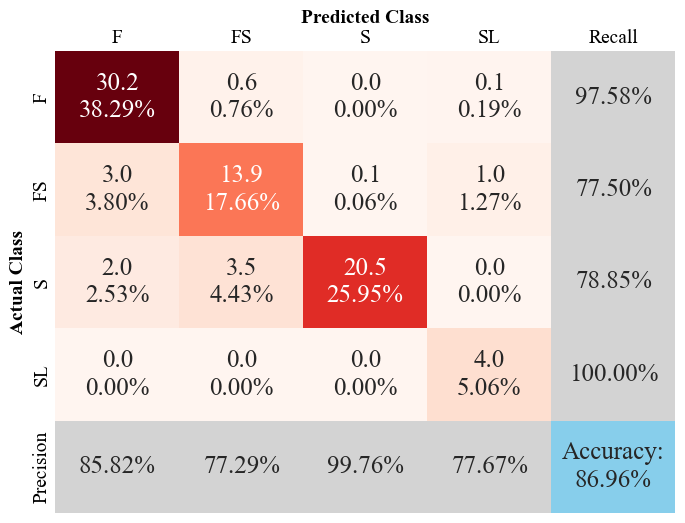

Running CB on cvae folds


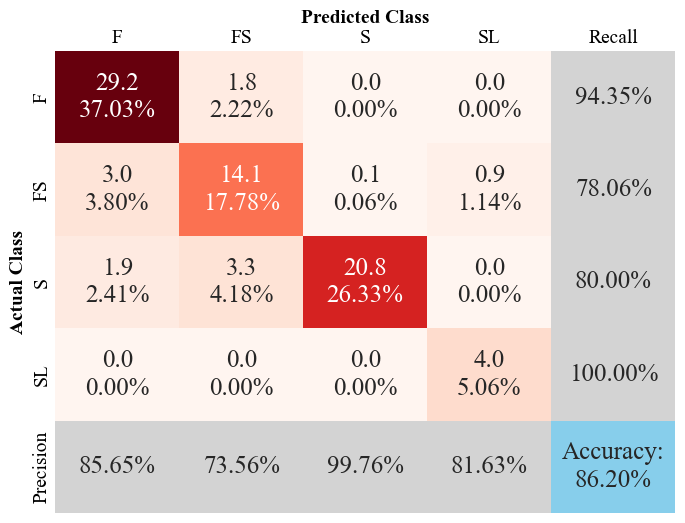

In [12]:
# Define models and folds
models = ["NB", "DT", "MLP", "RF",  "ET", "XGB", "LGB", "CB"]
methods = ["regular", "random", "smote", "adasyn", "ctgan", "cvae"]
folds_dict = {method: all_folds_dict[method] for method in methods if method in all_folds_dict}

# Run pipelines and save the results
results_dict = run_multiple_pipelines(models, folds_dict)
save_results(results_dict, filename="results_multiFolds_base.pkl")

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


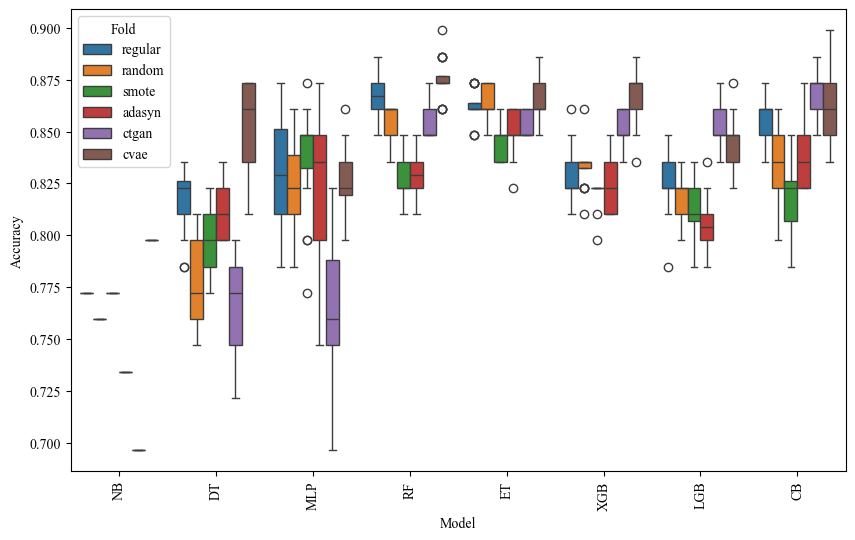

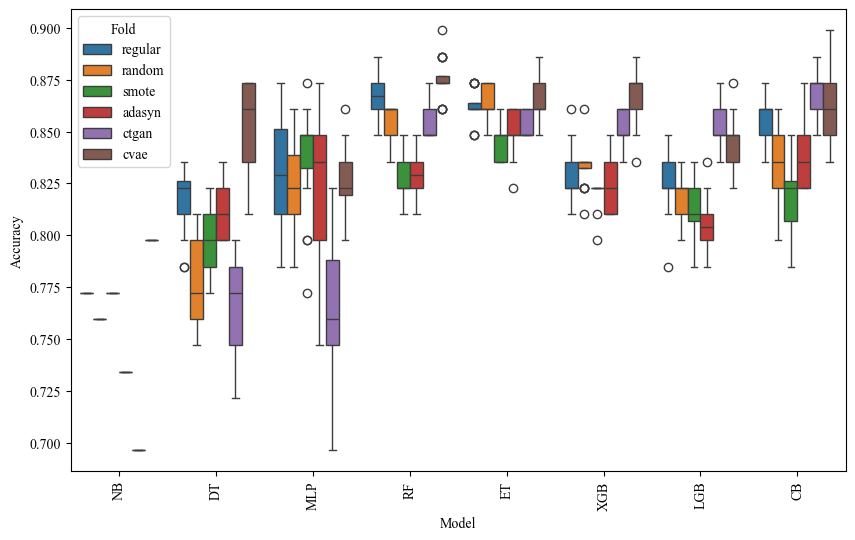

In [13]:
plot_metric_boxplot(results_dict, models, methods, metric="Accuracy", filename='acc_boxplot.eps')
plot_metric_boxplot(results_dict, models, methods, metric="Accuracy", filename='acc_boxplot.tiff')

In [14]:
def highlight_metrics(df):
    # Columns to highlight maximum (performance metrics)
    max_cols = ['Accuracy', 'Recall', 'Precision', 'F1-Score']
    # Columns to highlight minimum (time)
    min_cols = [] #['Avg Time (s)']

    format_dict = {col: "{:.3f}" for col in max_cols}
    format_dict.update({'Avg Time (s)': "{:.1f}"})
    
    def highlight_max(s):
        is_max = s == s.max()
        return ['font-weight: bold' if v else '' for v in is_max]
    
    def highlight_min(s):
        is_min = s == s.min()
        return ['font-weight: bold' if v else '' for v in is_min]
    
    styled =  df.style.format(format_dict)
    
    for col in max_cols:
        if col in df.columns:
            styled = styled.apply(highlight_max, subset=[col])
    
    for col in min_cols:
        if col in df.columns:
            styled = styled.apply(highlight_min, subset=[col])
    
    return styled

In [15]:
model_order = ["NB", "DT", "MLP", "RF", "ET", "XGB", "LGB", "CB"]
method_order = ["regular", "random", "smote", "adasyn", "ctgan", "cvae"]

In [16]:
result_df = summarize_results_table(results_dict, metrics=['Accuracy', 'Recall', 'Precision', 'F1-Score'], mode='best', 
                            model_order=model_order, method_order=method_order)

In [17]:
df_multi = result_df.set_index(['Model', 'Method'])
highlight_metrics(df_multi)

In [18]:
result_df = summarize_results_table(results_dict, metrics=['Accuracy', 'Recall', 'Precision', 'F1-Score'], mode='median', 
                            model_order=model_order, method_order=method_order)

In [19]:
df_multi = result_df.set_index(['Model', 'Method'])
highlight_metrics(df_multi)

In [31]:
df_multi

Accuracy  Recall  Precision  F1-Score  Avg Time (s)
Model Method                                                      
NB    regular    0.7722  0.6516     0.6668    0.6564          1.78
      random     0.7595  0.7450     0.6905    0.6907          1.87
      smote      0.7722  0.7562     0.7305    0.7034          1.79
      adasyn     0.7342  0.6744     0.6702    0.6472          1.81
      ctgan      0.6962  0.5095     0.5561    0.5074          1.78
      cvae       0.7975  0.6692     0.8365    0.6954          1.78
DT    regular    0.8354  0.8641     0.8183    0.8362          3.83
      random     0.8101  0.7947     0.7996    0.7870          4.10
      smote      0.8228  0.7966     0.7347    0.7473          4.53
      adasyn     0.8354  0.8614     0.7969    0.8180          4.37
      ctgan      0.7975  0.7769     0.7157    0.7303          4.03
      cvae       0.8734  0.8972     0.8829    0.8809          4.48
MLP   regular    0.8734  0.8840     0.8641    0.8676        264.87
      random     0.8608  0.8802     0.8243    0.8409        352.87
      smote      0.8734  0.8899     0.8343    0.8502        297.05
      adasyn     0.8734  0.8899     0.8417    0.8500        334.86
      ctgan      0.8228  0.8560     0.7758    0.7860        966.04
      cvae       0.8608  0.8861     0.8767    0.8666        259.19
RF    regular    0.8861  0.8995     0.9037    0.9010        231.17
      random     0.8608  0.8802     0.8485    0.8579        243.00
      smote      0.8481  0.8737     0.7929    0.8165        315.82
      adasyn     0.8481  0.8737     0.7982    0.8197        272.40
      ctgan      0.8734  0.8899     0.8447    0.8564        274.95
      cvae       0.8987  0.9060     0.9164    0.9093        295.90
ET    regular    0.8734  0.8899     0.9028    0.8933        155.31
      random     0.8734  0.8899     0.8577    0.8689        169.47
      smote      0.8608  0.8802     0.8243    0.8409        157.12
      adasyn     0.8608  0.8802     0.8243    0.8409        157.03
      ctgan      0.8608  0.8802     0.8866    0.8792        154.35
      cvae       0.8861  0.8979     0.9142    0.9030        146.06
XGB   regular    0.8608  0.8744     0.8835    0.8766        422.71
      random     0.8608  0.8845     0.8918    0.8828        383.53
      smote      0.8228  0.8560     0.7788    0.7991        394.39
      adasyn     0.8481  0.8722     0.8104    0.8298        467.76
      ctgan      0.8608  0.8802     0.8837    0.8777        714.04
      cvae       0.8861  0.9022     0.9081    0.9015        394.81
LGB   regular    0.8481  0.8737     0.8788    0.8716        100.75
      random     0.8354  0.8672     0.8698    0.8658        126.06
      smote      0.8354  0.8657     0.7867    0.8099        159.18
      adasyn     0.8354  0.8598     0.8018    0.8207        117.33
      ctgan      0.8734  0.8899     0.8745    0.8688        172.11
      cvae       0.8734  0.8883     0.8907    0.8845        135.09
CB    regular    0.8734  0.8957     0.8595    0.8728        797.13
      random     0.8608  0.8818     0.8232    0.8424       1585.91
      smote      0.8481  0.8722     0.8130    0.8313       6472.61
      adasyn     0.8734  0.8899     0.8248    0.8399        871.66
      ctgan      0.8861  0.8979     0.8712    0.8787        960.71
      cvae       0.8987  0.9075     0.8918    0.8901       1724.03

In [20]:
result_df = summarize_results_table(results_dict, metrics=['Accuracy', 'Recall', 'Precision', 'F1-Score'], mode='best', 
                            model_order=model_order, method_order=method_order)
df_multi = result_df.set_index(['Model', 'Method'])
# Get the index of the max Accuracy for each Model
best_idx = df_multi.groupby(level='Model')['Accuracy'].idxmax()

# Use the index to extract the best rows
best_combinations = df_multi.loc[best_idx]

In [21]:
best_combinations

,,Accuracy,Recall,Precision,F1-Score,Avg Time (s)
Model,Method,,,,,
NB,cvae,0.7975,0.6692,0.8365,0.6954,1.78
DT,cvae,0.8734,0.8972,0.8829,0.8809,4.48
MLP,regular,0.8734,0.8840,0.8641,0.8676,264.87
RF,cvae,0.8987,0.9060,0.9164,0.9093,295.90
ET,cvae,0.8861,0.8979,0.9142,0.9030,146.06
XGB,cvae,0.8861,0.9022,0.9081,0.9015,394.81
LGB,ctgan,0.8734,0.8899,0.8745,0.8688,172.11
CB,cvae,0.8987,0.9075,0.8918,0.8901,1724.03


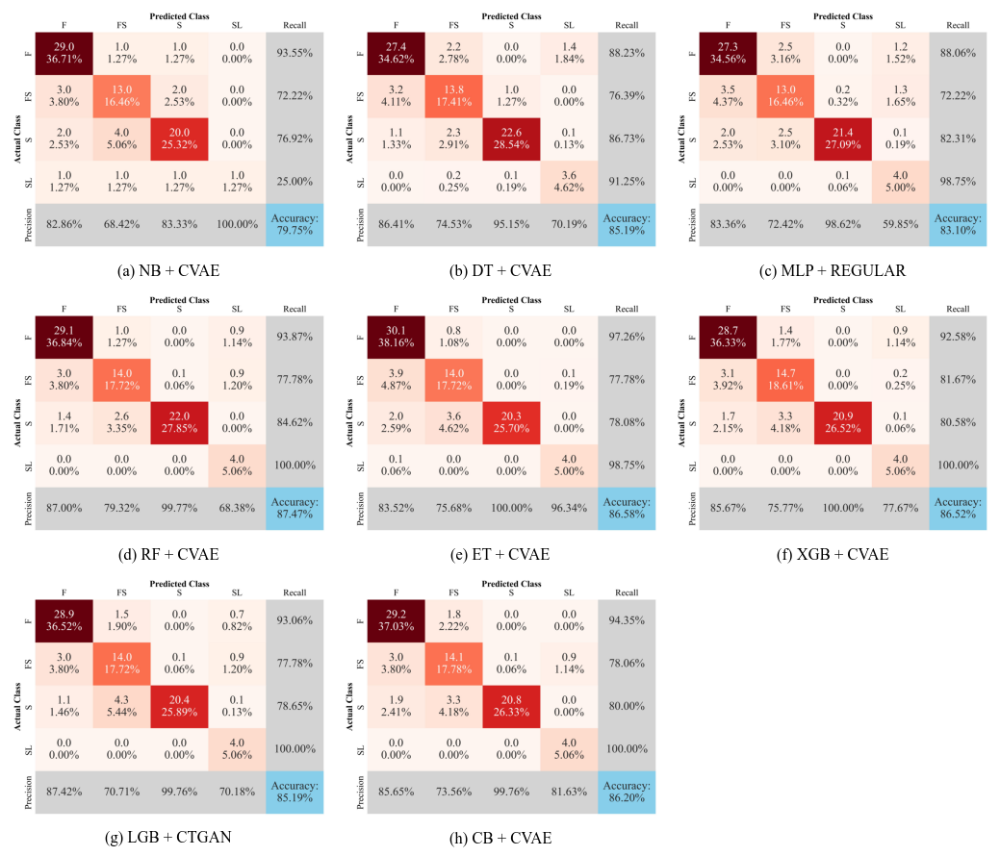

In [24]:
import string

n_cols = 3
n_rows = int(np.ceil(len(model_order) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3.5, n_rows * 3))

# Flatten axes for easy indexing (works even if n_rows or n_cols == 1)
axes = axes.flatten() if n_rows * n_cols > 1 else [axes]

best_pairing = best_combinations.index.tolist()

for idx in range(len(axes)):
    ax = axes[idx]
    if idx < len(best_pairing):
        model, method = best_pairing[idx]
        img_name = f"figures/{model}_{method}_avg_confusion_matrix.jpeg"
        
        if os.path.exists(img_name):
            img = plt.imread(img_name)
            ax.imshow(img)
        else:
            ax.text(0.5, 0.5, 'Image not found', ha='center', va='center', fontsize=12, color='red')

        ax.axis('off')

        # Uppercase model and method
        model_upper = model.upper()
        method_upper = method.upper()

        # Add letter label (a), (b), ... at the bottom left
        letter = string.ascii_lowercase[idx]
        title_text = f"({letter}) {model_upper} + {method_upper}"
        
        # Place title below the image
        ax.text(
            0.5, -0.05,
            title_text,
            fontsize=12,
            ha='center',
            va='top',
            transform=ax.transAxes
        )
    else:
        ax.axis('off')

plt.tight_layout()
plt.savefig(f"plots/result_classification.eps", bbox_inches='tight', dpi=600)
plt.savefig(f"plots/result_classification.tiff", bbox_inches='tight', dpi=600)
plt.show()

# Ensemble

Running Stacking on regular folds


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

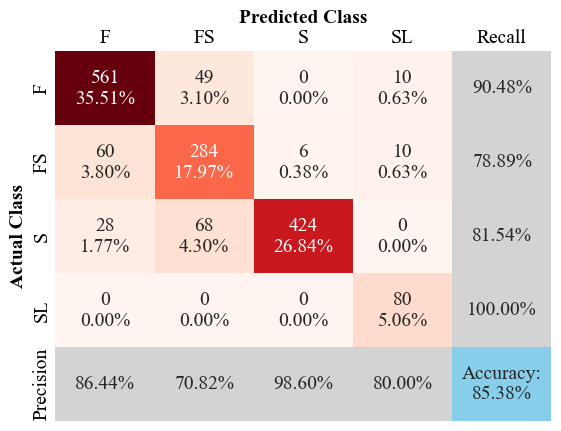

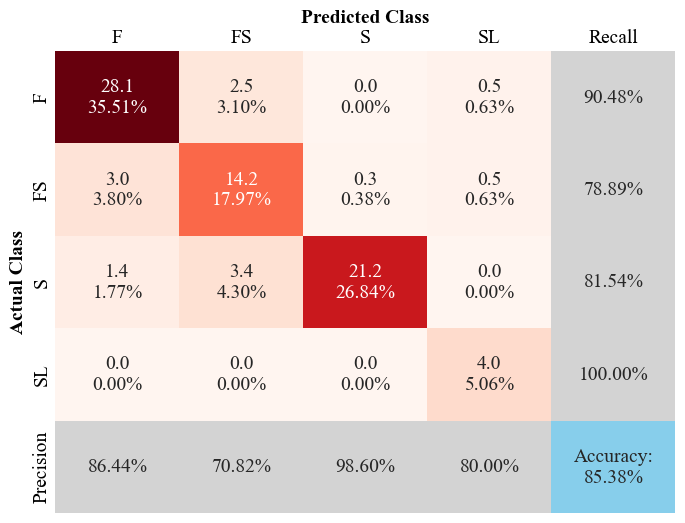

Running Stacking on random folds


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

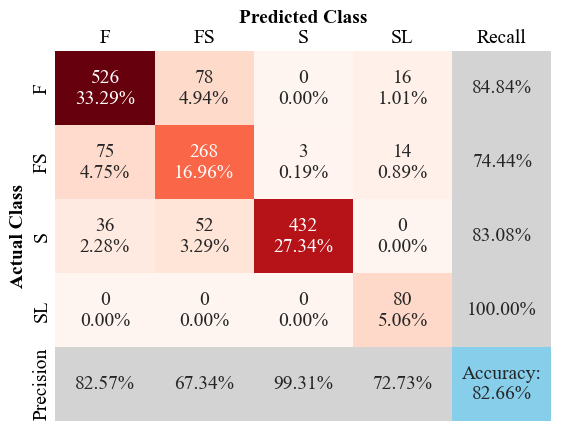

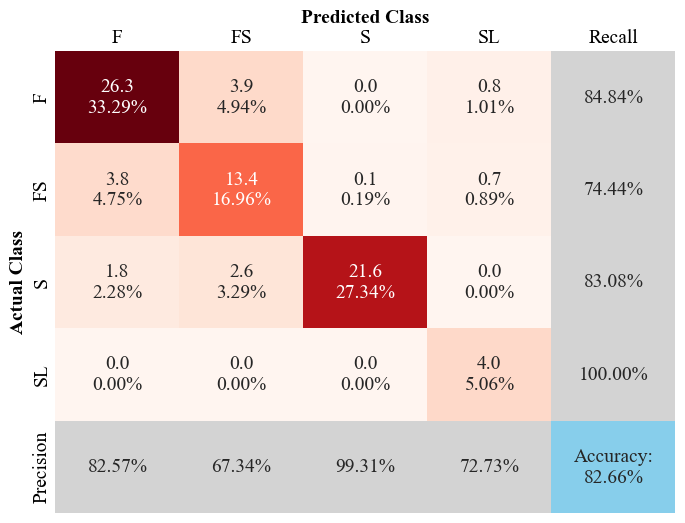

Running Stacking on smote folds


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

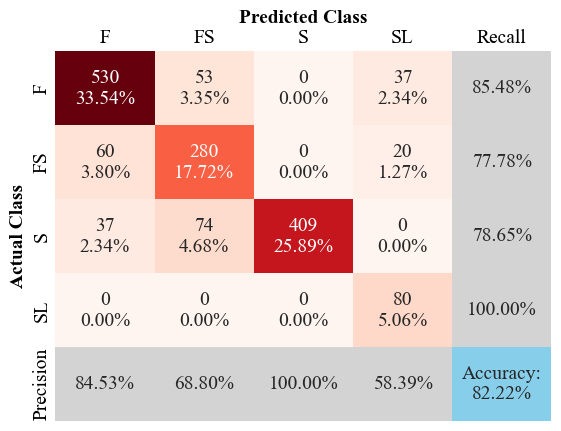

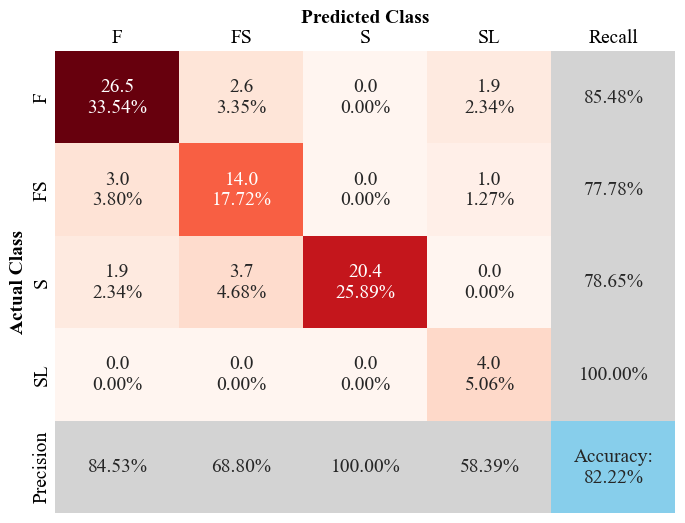

Running Stacking on adasyn folds


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

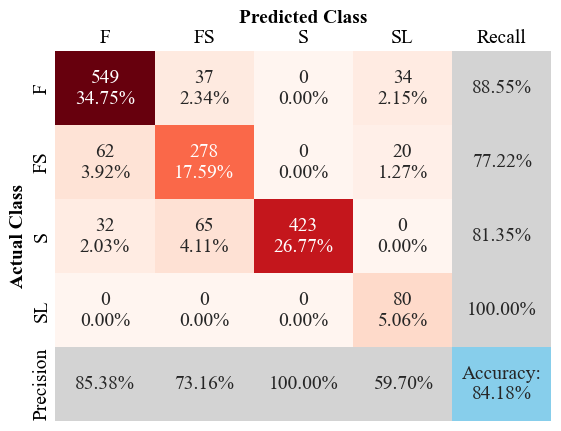

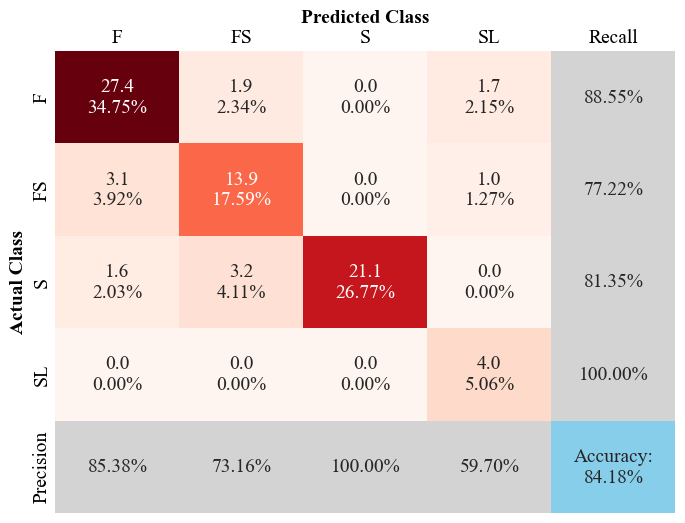

Running Stacking on ctgan folds


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

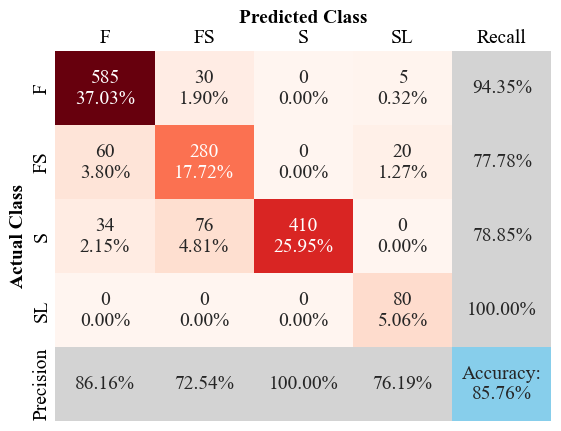

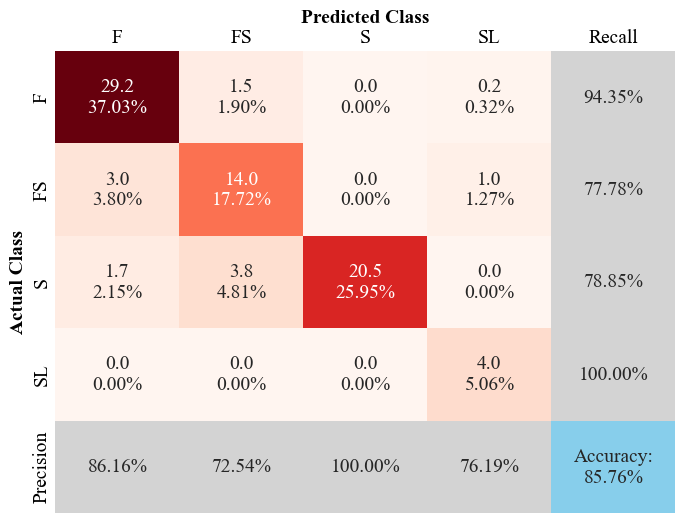

Running Stacking on cvae folds


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

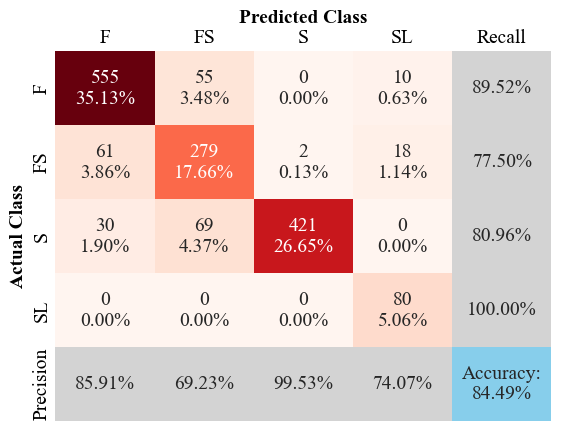

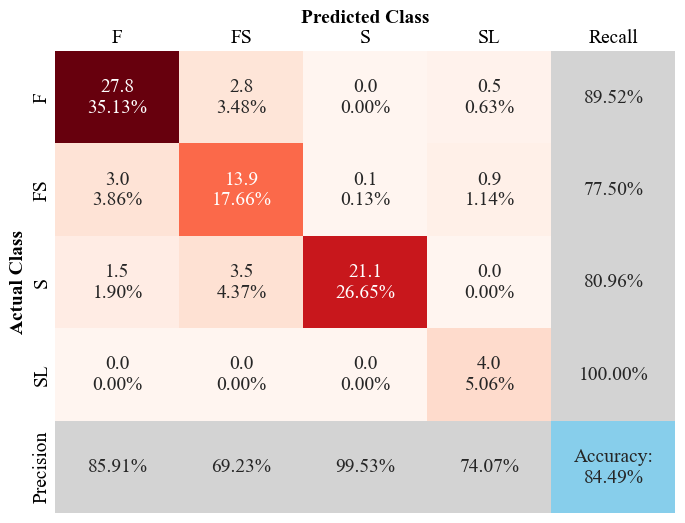

In [19]:
# Run pipelines and save the results
results_dict = run_multiple_pipelines(["Stacking"], folds_dict)
save_results(results_dict, filename="results_multiFolds_stacking.pkl")

In [33]:
rf_param_dict = summarize_model_params(results_dict, model_name='RF')
rf_param_dict

,Model_Method,Best Params
0,RF_regular,"{'rf_n_estimators': 425, 'rf_max_depth': 8, 'r..."
1,RF_random,"{'rf_n_estimators': 233, 'rf_max_depth': 12, '..."
2,RF_smote,"{'rf_n_estimators': 469, 'rf_max_depth': 12, '..."
3,RF_adasyn,"{'rf_n_estimators': 235, 'rf_max_depth': 11, '..."
4,RF_cvae,"{'rf_n_estimators': 328, 'rf_max_depth': 7, 'r..."
5,RF_gcs,"{'rf_n_estimators': 236, 'rf_max_depth': 8, 'r..."
6,RF_ctgan,"{'rf_n_estimators': 287, 'rf_max_depth': 12, '..."


In [34]:
# regular
rf_param_dict['Best Params'].loc[0]

{'rf_n_estimators': 425,
 'rf_max_depth': 8,
 'rf_min_samples_split': 2,
 'rf_min_samples_leaf': 1,
 'max_features': 0.25732930753297395}

In [35]:
# cvae
rf_param_dict['Best Params'].loc[4]

{'rf_n_estimators': 328,
 'rf_max_depth': 7,
 'rf_min_samples_split': 8,
 'rf_min_samples_leaf': 2,
 'max_features': 0.9093561479089233}

# SHAP

In [26]:
col_names = additional_info['numerical_cols']+additional_info['encoders'][0].categories_[0].tolist()

(X_train_cvae, y_train_cvae, _, _) = folds_dict['cvae'][0]
(X_train, y_train, X_test, y_test) = folds_dict['regular'][0]

X_train_df = pd.DataFrame(X_train, columns=col_names)
X_test_df = pd.DataFrame(X_test, columns=col_names)
X_train_cvae_df = pd.DataFrame(X_train_cvae, columns=col_names)

X_df = pd.concat([X_train_df, X_test_df])

X = X_df
rename_dict = {
    'M/Vlw': r'$M/Vl_{w}$',
    'lw/tw': r'$l_{w}/t_{w}$',
    'ρvwFy,vw/fc': r'$\rho_{vw}F_{y,vw}/f_{c}^\prime$',
    'ρhwFy,hw/fc': r'$\rho_{hw}F_{y,hw}/f_{c}^\prime$',
    'ρvbFy,vb/fc': r'$\rho_{vb}F_{y,vb}/f_{c}^\prime$',
    'ρhbFy,hb/fc': r'$\rho_{hb}F_{y,hb}/f_{c}^\prime$',
    'P/fcAg': r'$P/f_{c}^\prime A_{g}$',
    'Section': 'Section Shape',
    'Ab/Ag': r'$A_{b}/A_{g}$',
    'R': 'Rectangular',
    'B': 'Barbell',
    'F': 'Flanged'
}
X = X.rename(columns=rename_dict)

In [27]:
# Regular
params = {'n_estimators': 425, 'max_depth': 8, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.25732930753297395}
model_regular = RandomForestClassifier(**params, random_state=42)
model_regular.fit(X_train, y_train)
explainer = shap.TreeExplainer(model_regular)
shap_values_regular = explainer.shap_values(X)

# CVAE
params = {'n_estimators': 328, 'max_depth': 7, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.9093561479089233}
model_cvae = RandomForestClassifier(**params, random_state=42)
model_cvae.fit(X_train_cvae, y_train_cvae)
explainer2 = shap.TreeExplainer(model_cvae)
shap_values_augmented = explainer2.shap_values(X)

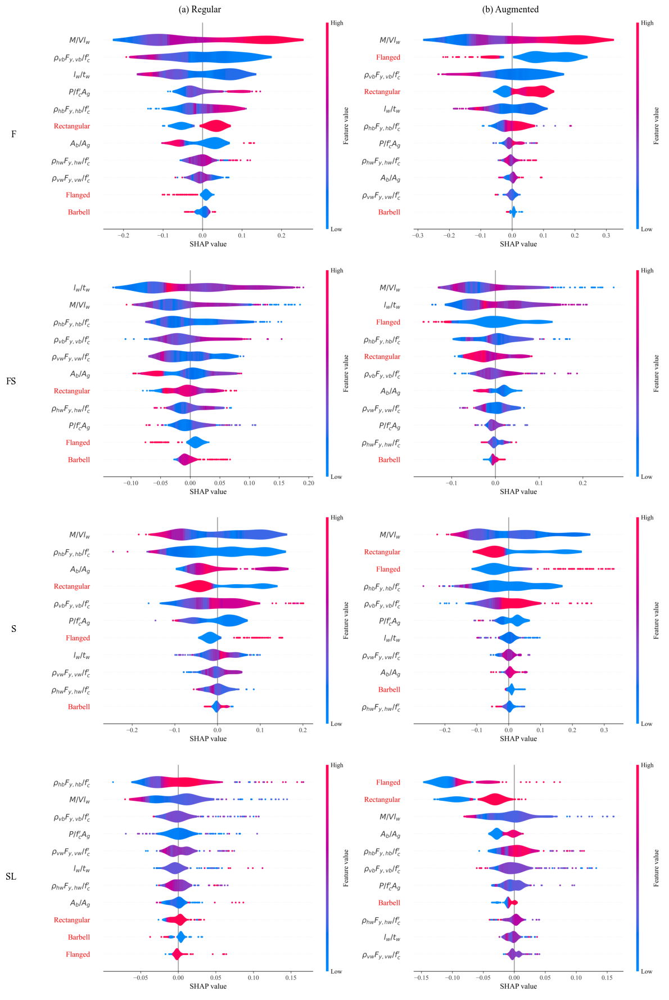

In [85]:
class_labels = ['F', 'FS', 'S', 'SL']
model_names = ['(a) Regular', '(b) Augmented']

highlight_features = {'Barbell': "red", 'Flanged': "red", 'Rectangular': "red"}

# Save SHAP plots
for row, class_label in enumerate(class_labels):
    for col, model_name in enumerate(model_names):
        shap_values = (
            shap_values_regular[..., row]
            if col == 0 else
            shap_values_augmented[..., row]
        )
        plt.figure(figsize=(8, 6))
        shap.summary_plot(shap_values, X, show=False, plot_type="violin")
        plt.xlabel("SHAP value")
        
        ax = plt.gca()
        for tick in ax.get_yticklabels():
            label = tick.get_text()
            if label in highlight_features:
                tick.set_color(highlight_features[label])
        
        plt.savefig(f"tmp_plot_{row}_{col}.png", bbox_inches='tight', dpi=600)
        plt.close()

# Load into subplot
fig, axes = plt.subplots(4, 2, figsize=(12, 18))
for row in range(4):
    for col in range(2):
        img = plt.imread(f"tmp_plot_{row}_{col}.png")
        axes[row, col].imshow(img)
        axes[row, col].axis('off')

        if row == 0:
            axes[row, col].set_title(model_names[col], fontsize=12)
        if col == 0:
            axes[row, col].text(-0.1, 0.5, class_labels[row], va='center', ha='right',
                                transform=axes[row, col].transAxes, fontsize=12)
            
plt.tight_layout()

plt.savefig(f"plots/violin_plot.eps", bbox_inches='tight', dpi=600)
plt.savefig(f"plots/violin_plot.tiff", bbox_inches='tight', dpi=600)
plt.show()

In [28]:
plt.rcParams.update({'font.size': 14})

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


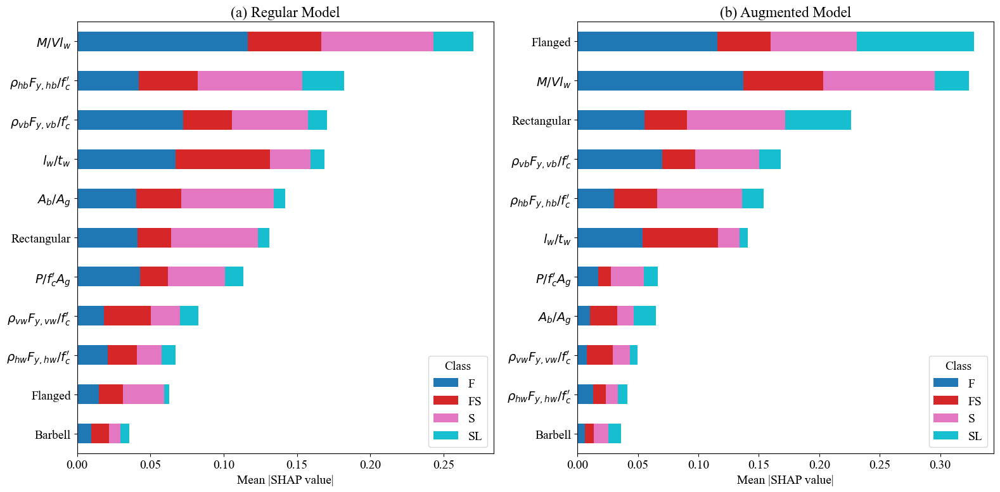

In [30]:
class_labels = ['F', 'FS', 'S', 'SL']
model_names = ['(a) Regular', '(b) Augmented']

# Calculate mean absolute SHAP values per class for both models
mean_abs_shap_regular = {
    class_label: np.abs(shap_values_regular[:, :, i]).mean(axis=0)
    for i, class_label in enumerate(class_labels)
}

mean_abs_shap_augmented = {
    class_label: np.abs(shap_values_augmented[:, :, i]).mean(axis=0)
    for i, class_label in enumerate(class_labels)
}

# Convert to DataFrames
df_regular = pd.DataFrame(mean_abs_shap_regular, index=col_names)
df_augmented = pd.DataFrame(mean_abs_shap_augmented, index=col_names)

# Rename features for better labels
df_regular.rename(index=rename_dict, inplace=True)
df_augmented.rename(index=rename_dict, inplace=True)

# Sort by total importance descending for consistent ordering
df_regular['total'] = df_regular.sum(axis=1)
df_augmented['total'] = df_augmented.sum(axis=1)

df_regular_sorted = df_regular.sort_values(by='total', ascending=False).drop(columns='total')
df_augmented_sorted = df_augmented.sort_values(by='total', ascending=False).drop(columns='total') 

# Plot side-by-side
fig, axes = plt.subplots(ncols=2, figsize=(16, 8), sharey=False)

df_regular_sorted.plot(kind='barh', stacked=True, colormap='tab10', ax=axes[0])
axes[0].set_title('(a) Regular Model')
axes[0].set_xlabel('Mean |SHAP value|')
axes[0].invert_yaxis()

df_augmented_sorted.plot(kind='barh', stacked=True, colormap='tab10', ax=axes[1])
axes[1].set_title('(b) Augmented Model')
axes[1].set_xlabel('Mean |SHAP value|')
axes[1].invert_yaxis()

# Legend only once on the right plot
axes[1].legend(title='Class')
axes[0].legend(title='Class')

plt.tight_layout()

plt.savefig(f"plots/bar_plot.eps", bbox_inches='tight', dpi=600)
plt.savefig(f"plots/bar_plot.tiff", bbox_inches='tight', dpi=600)
plt.show()

In [91]:
shap_interaction_values = explainer2.shap_interaction_values(X)

In [87]:
X = X_df
X.columns

Index(['M/Vlw', 'lw/tw', 'ρvwFy,vw/fc', 'ρhwFy,hw/fc', 'ρvbFy,vb/fc',
       'ρhbFy,hb/fc', 'P/fcAg', 'Ab/Ag', 'B', 'F', 'R'],
      dtype='object')

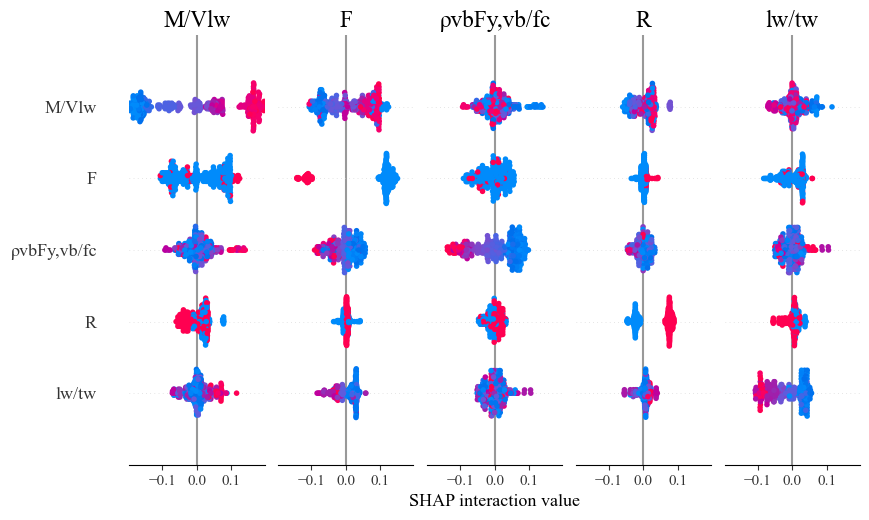

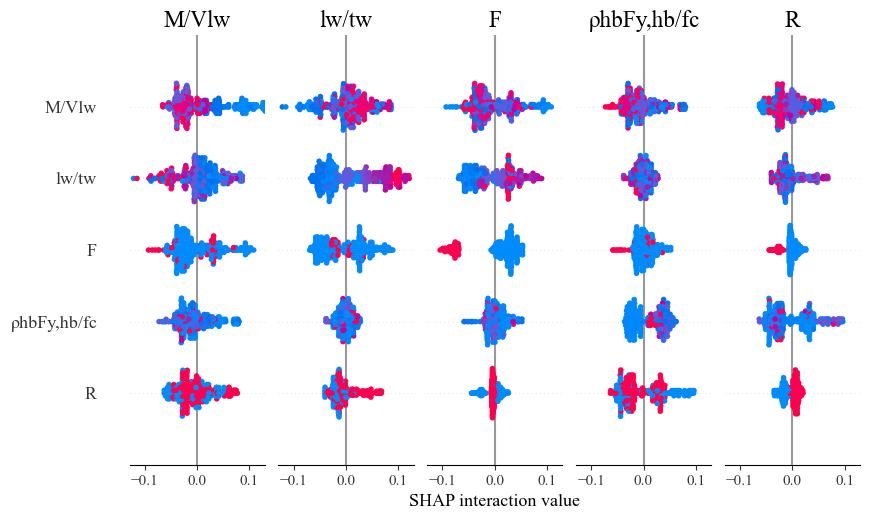

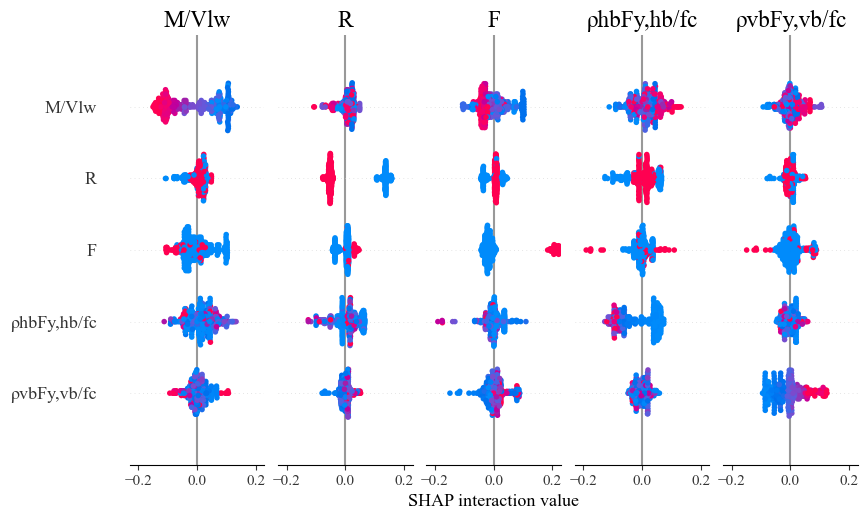

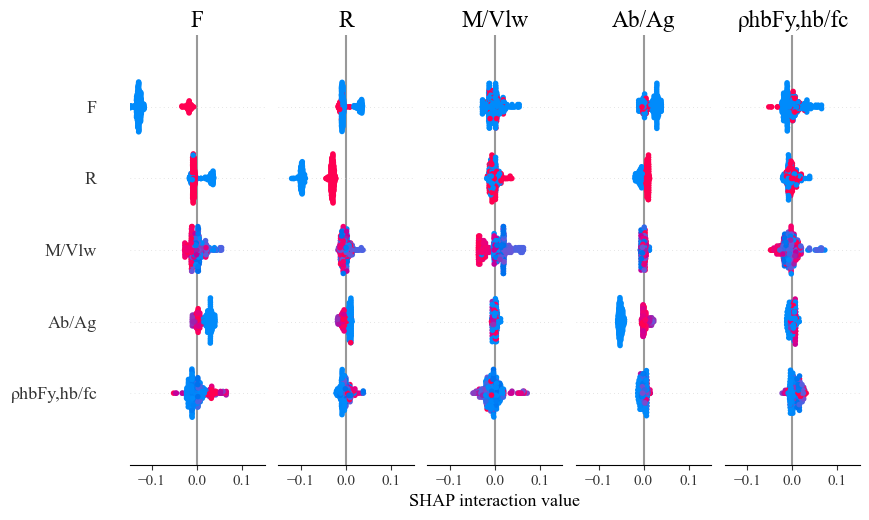

In [143]:
shap.summary_plot(shap_interaction_values[..., 0], X, plot_type='dot', max_display=5)
shap.summary_plot(shap_interaction_values[..., 1], X, plot_type='dot', max_display=5)
shap.summary_plot(shap_interaction_values[..., 2], X, plot_type='dot', max_display=5)
shap.summary_plot(shap_interaction_values[..., 3], X, plot_type='dot', max_display=5)

In [127]:
def reverse_numerical(X, additional_info):
    scaler = additional_info['selected_scaler']
    numerical_cols = additional_info['numerical_cols']
    len_numerical = additional_info['len_numerical']
    len_ohes = additional_info['len_ohes']
    
    # All columns that are not numerical (for final DataFrame columns)
    categorical_cols = [col for col in X.columns if col not in numerical_cols]

    X_np = X.to_numpy()
    
    # 1. Inverse transform numerical part
    X_num = scaler.inverse_transform(X_np[:, :len_numerical])
    # X_num = np.clip(X_num, a_min=0, a_max=None)
    
    # 2. Convert softmax to hard one-hot for each categorical group
    start_idx = len_numerical
    cat_cols_list = []
    for i, ohe_len in enumerate(len_ohes):
        ohe_columns = X_np[:, start_idx:start_idx + ohe_len]
        max_idx = np.argmax(ohe_columns, axis=1)
        
        hard_onehot = np.zeros_like(ohe_columns)
        hard_onehot[np.arange(len(max_idx)), max_idx] = 1
        
        cat_cols_list.append(hard_onehot)
        start_idx += ohe_len
    
    # Stack all hard one-hot arrays horizontally
    X_ohe = np.hstack(cat_cols_list)
    
    # 3. Convert numpy arrays back to DataFrames
    X_num_df = pd.DataFrame(X_num, columns=numerical_cols, index=X.index)
    X_ohe_df = pd.DataFrame(X_ohe, columns=categorical_cols, index=X.index)
    
    # 4. Concatenate numerical + categorical
    X_df = pd.concat([X_num_df, X_ohe_df], axis=1)
    
    return X_df

In [186]:
X_ori = reverse_numerical(X, additional_info)

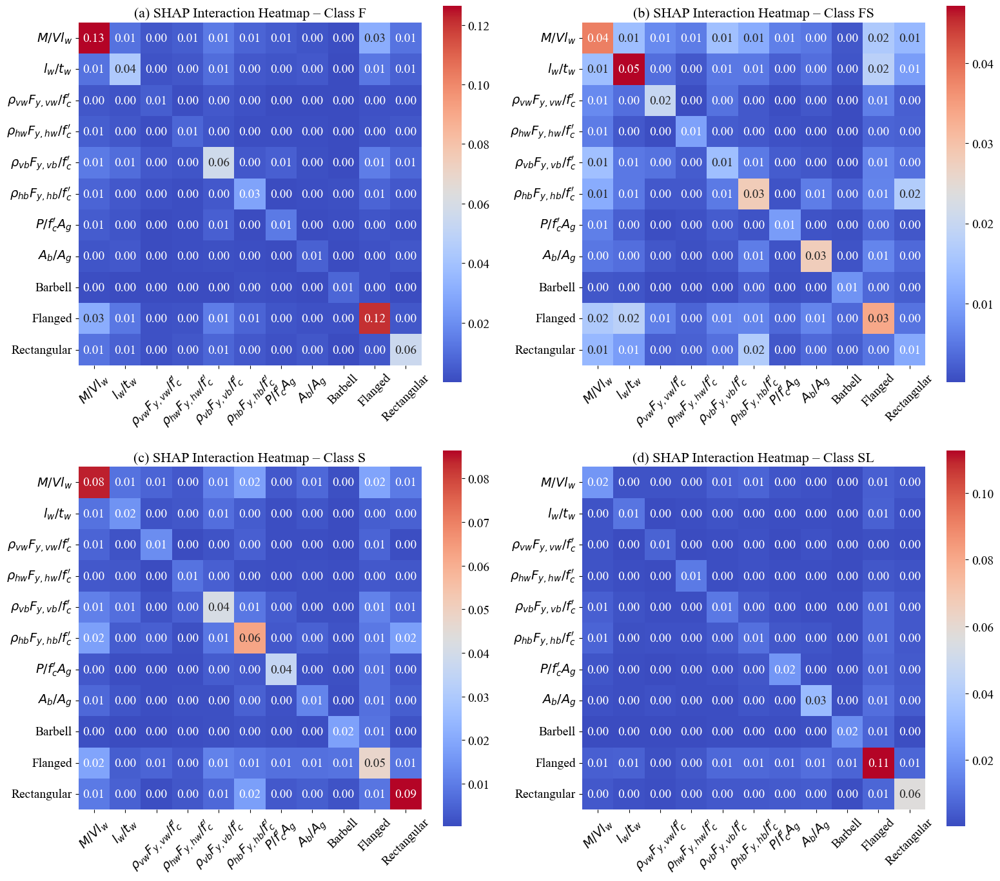

In [136]:
# Custom feature names
feature_names = [rename_dict.get(col, col) for col in X.columns]

# Set up 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
class_names = ["F", "FS", "S", "SL"]

for idx, class_name in enumerate(class_names):
    row = idx // 2
    col = idx % 2
    ax = axes[row, col]
    
    # Compute interaction matrix
    interaction_matrix = np.mean(np.abs(shap_interaction_values[..., idx]), axis=0)
    
    # Plot heatmap on subplot
    sns.heatmap(
        interaction_matrix,
        xticklabels=feature_names,
        yticklabels=feature_names,
        cmap="coolwarm",
        square=True,
        annot=True,
        fmt=".2f",
        ax=ax
    )
    letter = string.ascii_lowercase[idx]
    ax.set_title(f"({letter}) SHAP Interaction Heatmap – Class {class_name}", fontsize=16)
    ax.tick_params(axis='x', rotation=45)
    ax.tick_params(axis='y', rotation=0)

plt.tight_layout()
plt.savefig(f"plots/heatmap.eps", bbox_inches='tight', dpi=600)
plt.savefig(f"plots/heatmap.tiff", bbox_inches='tight', dpi=600)
plt.show()

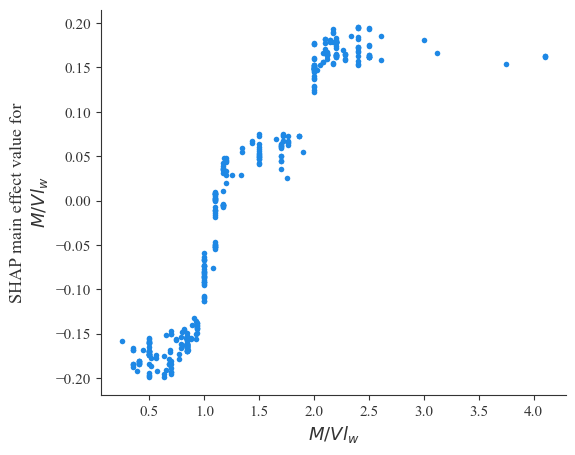

In [259]:
shap.dependence_plot(
            (0, 0),
            shap_interaction_values[..., 0],
            X_ori,
            feature_names=feature_names,
        )

In [272]:
X_ori = X_ori.rename(columns=rename_dict)

## Feature Interaction

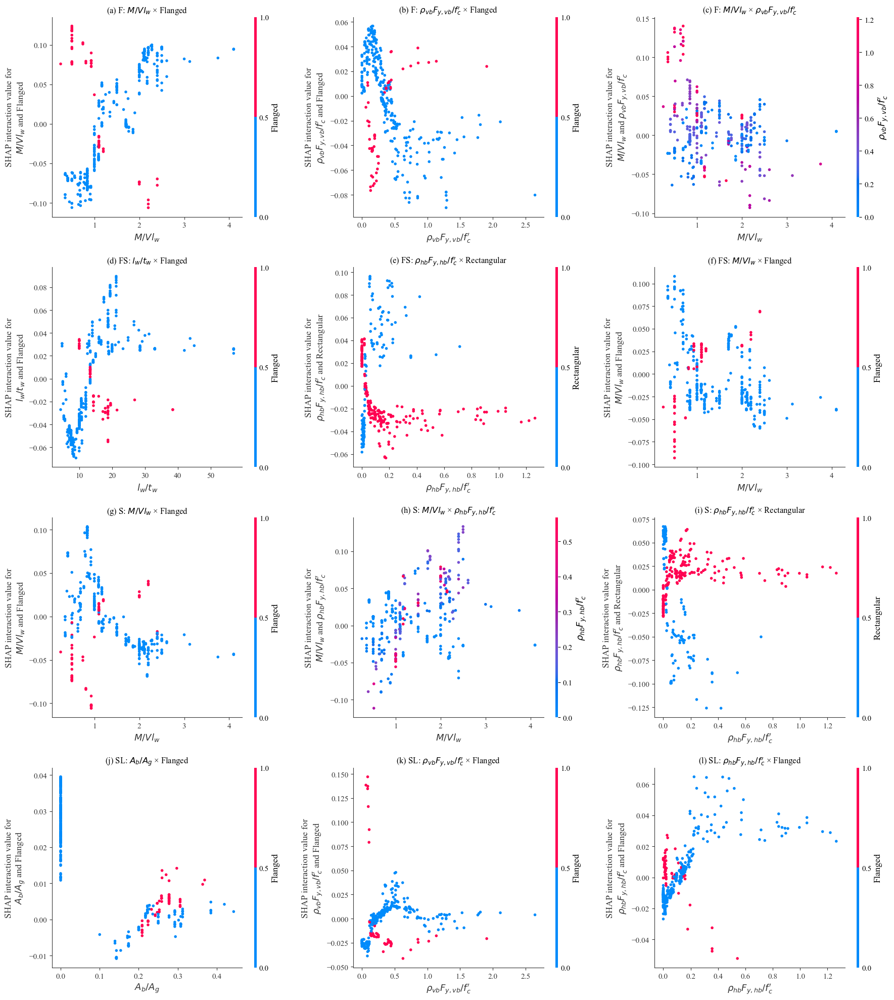

In [300]:
top_k = 3
class_names = ["F", "FS", "S", "SL"]
feature_names = [rename_dict.get(col, col) for col in X.columns]

# Prepare feature name to index map
name_to_index = {name: i for i, name in enumerate(feature_names)}

# Create 4x3 subplot (4 classes × 3 top pairs)
plt.close
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 20))

for row_idx, class_name in enumerate(class_names):
    # Get interaction matrix
    interaction_matrix = np.mean(np.abs(shap_interaction_values[..., row_idx]), axis=0)
    n_features = interaction_matrix.shape[0]
    upper_tri_indices = np.triu_indices(n_features, k=1)
    interaction_values = interaction_matrix[upper_tri_indices]
    feature_pairs = list(zip(*upper_tri_indices))
    top_indices = np.argsort(interaction_values)[::-1][:top_k]

    for col_idx, idx in enumerate(top_indices):
        i, j = feature_pairs[idx]
        ax = axes[row_idx, col_idx]

        # Plot into given subplot axis
        shap.dependence_plot(
            (i, j),
            shap_interaction_values[..., row_idx],
            X_ori,
            feature_names=feature_names,
            ax=ax,
            show=False,
        )
        f1, f2 = feature_names[i], feature_names[j]
        letter = string.ascii_lowercase[row_idx * 3 + col_idx]
        ax.set_title(f"({letter}) {class_name}: {f1} × {f2}", fontsize=12)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 1])
plt.savefig(f"plots/dependence.eps", bbox_inches='tight', dpi=600)
plt.savefig(f"plots/dependence.tiff", bbox_inches='tight', dpi=600)
plt.show()

In [254]:
import numpy as np
import itertools

top_k = 3
class_names = ["F", "FS", "S", "SL"]
feature_names = [rename_dict.get(col, col) for col in X.columns]

for class_idx, class_name in enumerate(class_names):
    # 1. Extract absolute interaction matrix for this class and average over samples
    interaction_matrix = np.mean(np.abs(shap_interaction_values[..., class_idx]), axis=0)
    
    # 2. Get upper triangle indices excluding the diagonal
    n_features = interaction_matrix.shape[0]
    upper_tri_indices = np.triu_indices(n_features, k=0)  # k=1 to skip diagonal
    
    # 3. Get the values and corresponding feature pairs
    interaction_values = interaction_matrix[upper_tri_indices]
    feature_pairs = [(feature_names[i], feature_names[j]) for i, j in zip(*upper_tri_indices)]
    
    # 4. Sort and get top K
    top_indices = np.argsort(interaction_values)[::-1][:top_k]
    top_pairs = [(feature_pairs[i], interaction_values[i]) for i in top_indices]
    
    # 5. Display result
    print(f"\nTop {top_k} SHAP interaction pairs for class '{class_name}':")
    for (feat1, feat2), val in top_pairs:
        print(f"  {feat1} × {feat2}: {val:.4f}")


Top 3 SHAP interaction pairs for class 'F':
  $M/Vl_{w}$ × $M/Vl_{w}$: 0.1264
  Flanged × Flanged: 0.1209
  $\rho_{vb}F_{y,vb}/f_{c}^\prime$ × $\rho_{vb}F_{y,vb}/f_{c}^\prime$: 0.0565

Top 3 SHAP interaction pairs for class 'FS':
  $l_{w}/t_{w}$ × $l_{w}/t_{w}$: 0.0471
  $M/Vl_{w}$ × $M/Vl_{w}$: 0.0383
  Flanged × Flanged: 0.0337

Top 3 SHAP interaction pairs for class 'S':
  Rectangular × Rectangular: 0.0865
  $M/Vl_{w}$ × $M/Vl_{w}$: 0.0843
  $\rho_{hb}F_{y,hb}/f_{c}^\prime$ × $\rho_{hb}F_{y,hb}/f_{c}^\prime$: 0.0625

Top 3 SHAP interaction pairs for class 'SL':
  Flanged × Flanged: 0.1128
  Rectangular × Rectangular: 0.0570
  $A_{b}/A_{g}$ × $A_{b}/A_{g}$: 0.0327


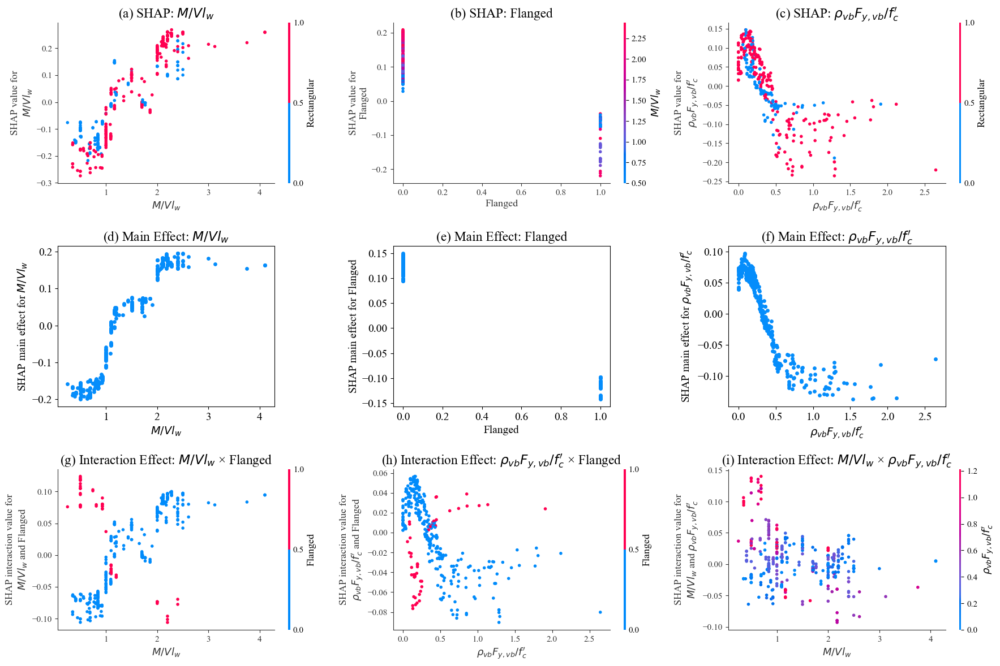

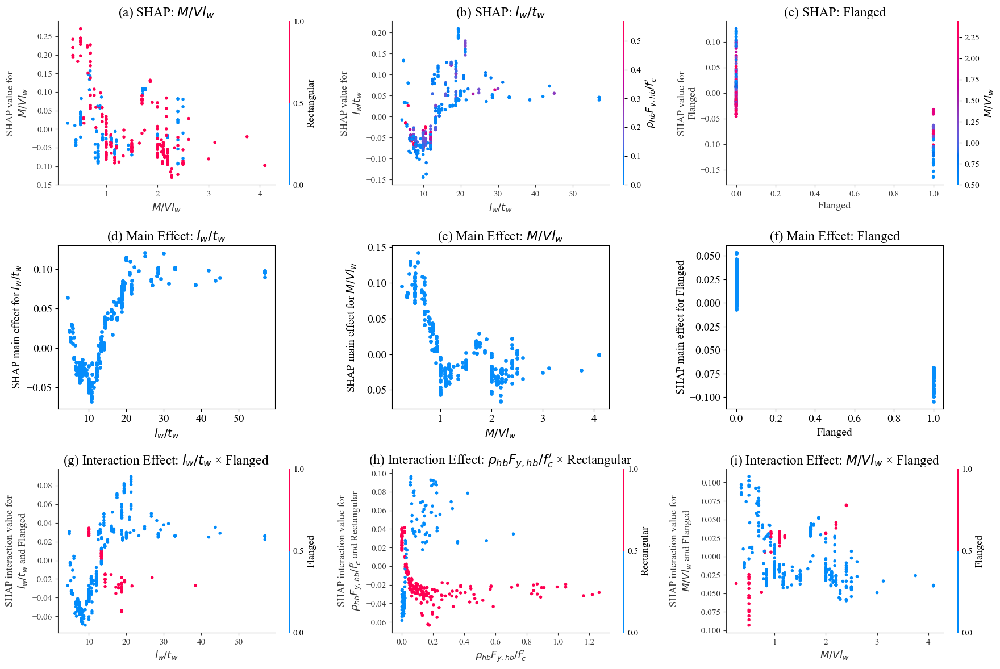

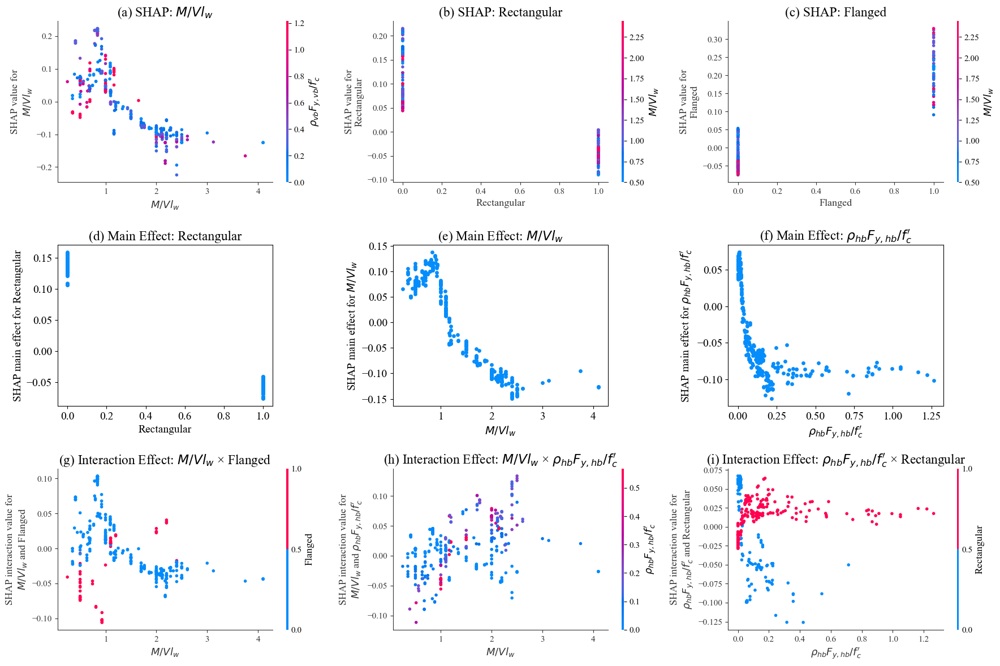

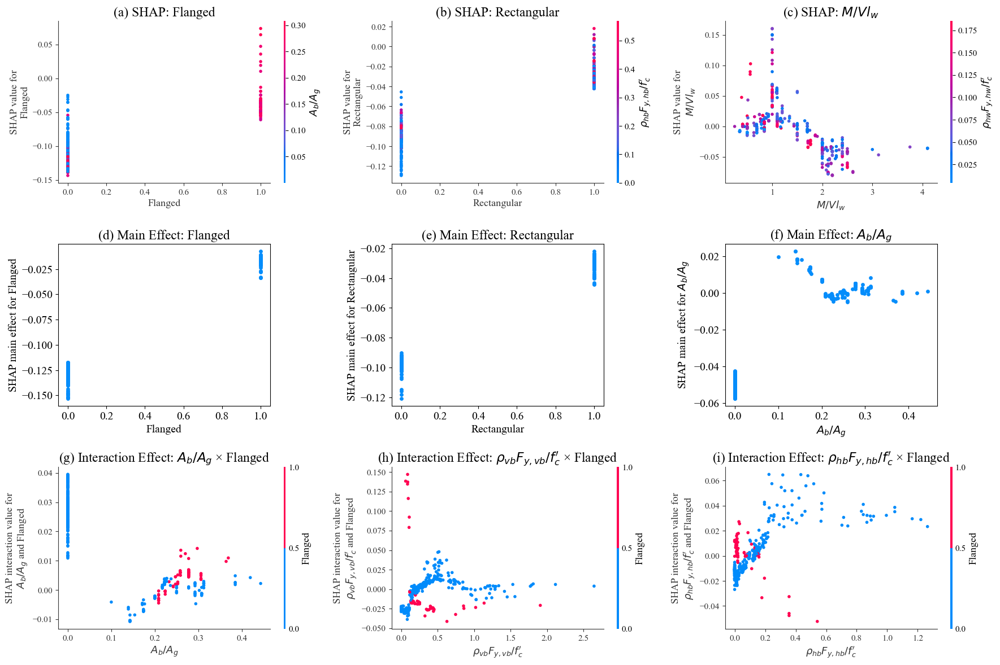

In [352]:
import matplotlib.pyplot as plt
import shap

feature_names = [rename_dict.get(col, col) for col in X.columns]

for row_idx, class_name in enumerate(class_names):
    class_dir = f"plots/dependence_per_class/{class_name}"
    os.makedirs(class_dir, exist_ok=True)

    fig, axs = plt.subplots(3, 3, figsize=(18, 12))
    axs = axs.flatten()

    # ---------- (a–c): SHAP value plots ----------
    shap_main = np.abs(shap_values_augmented[..., row_idx])
    shap_mean = np.mean(shap_main, axis=0)
    top_main_feats = np.argsort(shap_mean)[::-1][:3]

    for i, feat_idx in enumerate(top_main_feats):
        shap.dependence_plot(
            feat_idx,
            shap_values_augmented[..., row_idx],
            X_ori,
            feature_names=feature_names,
            show=False,
            ax=axs[i]
        )
        axs[i].set_title(f"({chr(97 + i)}) SHAP: {feature_names[feat_idx]}")

    # ---------- (d–f): Custom scatterplots for main effect (interaction diagonal) ----------
    interaction_matrix = np.mean(np.abs(shap_interaction_values[..., row_idx]), axis=0)
    main_diagonal = np.diag(interaction_matrix)
    top_diag_feats = np.argsort(main_diagonal)[::-1][:3]

    for j, feat_idx in enumerate(top_diag_feats):
        ax_idx = 3 + j
        ax = axs[ax_idx]
        # Custom scatter plot: x = feature value, y = diagonal SHAP interaction value
        x_vals = X_ori.iloc[:, feat_idx]
        y_vals = shap_interaction_values[..., row_idx][:, feat_idx, feat_idx]

        scatter = ax.scatter(x_vals, y_vals, color='#058dfb', s=15)
        ax.set_xlabel(feature_names[feat_idx])
        ax.set_ylabel(f"SHAP main effect for {feature_names[feat_idx]}")
        ax.set_title(f"({chr(97 + 3 + j)}) Main Effect: {feature_names[feat_idx]}")
        cbar = fig.colorbar(scatter, ax=ax, label=feature_names[feat_idx])
        cbar.ax.set_visible(False)

    # ---------- (g–i): SHAP feature interaction (non-diagonal) ----------
    n_feat = interaction_matrix.shape[0]
    upper_idx = np.triu_indices(n_feat, k=1)
    interaction_vals = interaction_matrix[upper_idx]
    feature_pairs = list(zip(*upper_idx))
    top_pairs = np.argsort(interaction_vals)[::-1][:3]

    for k, pair_idx in enumerate(top_pairs):
        i_idx, j_idx = feature_pairs[pair_idx]
        ax_idx = 6 + k
        shap.dependence_plot(
            (i_idx, j_idx),
            shap_interaction_values[..., row_idx],
            X_ori,
            feature_names=feature_names,
            show=False,
            ax=axs[ax_idx]
        )
        axs[ax_idx].set_title(f"({chr(97 + 6 + k)}) Interaction Effect: {feature_names[i_idx]} × {feature_names[j_idx]}")

    plt.tight_layout()
    fig.savefig(f"{class_dir}/all_dependence_plots.tiff", dpi=600)
    fig.savefig(f"{class_dir}/all_dependence_plots.eps", dpi=600)
    plt.show()

### Saving Loading

In [336]:
feature_names = [rename_dict.get(col, col) for col in X.columns]

all_meta = {}  # key: class_name, value: list of dicts with file info

for row_idx, class_name in enumerate(class_names):
    class_dir = f"plots/dependence_per_class/{class_name}"
    os.makedirs(class_dir, exist_ok=True)

    meta = []

    # ---------- (a–c): SHAP value plots ----------
    shap_main = np.abs(shap_values_augmented[..., row_idx])
    shap_mean = np.mean(shap_main, axis=0)
    top_main_feats = np.argsort(shap_mean)[::-1][:3]

    for i, feat_idx in enumerate(top_main_feats):
        plt.figure(figsize=(6, 4))
        shap.dependence_plot(
            feat_idx,
            shap_values_augmented[..., row_idx],
            X_ori,
            feature_names=feature_names,
            show=False,
        )
        plt.tight_layout()
        fname = f"dependence_a{i+1}_shap_{feat_idx}.png"
        plt.savefig(f"{class_dir}/{fname}", dpi=300)
        plt.close()

        meta.append({
            "filename": fname,
            "letter": chr(97 + len(meta)),  # 'a', 'b', ...
            "type": "SHAP",
            "feature_idx": feat_idx,
            "title": f"({chr(97 + i)}) SHAP: {feature_names[feat_idx]}"
        })

    # ---------- (d–f): SHAP main effect from interaction diagonal ----------
    interaction_matrix = np.mean(np.abs(shap_interaction_values[..., row_idx]), axis=0)
    main_diagonal = np.diag(interaction_matrix)
    top_diag_feats = np.argsort(main_diagonal)[::-1][:3]

    for j, feat_idx in enumerate(top_diag_feats):
        plt.figure(figsize=(6, 4))
        shap.dependence_plot(
            (feat_idx, feat_idx),
            shap_interaction_values[..., row_idx],
            X_ori,
            feature_names=feature_names,
            show=False,
        )
        plt.tight_layout()
        fname = f"dependence_b{j+1}_main_{feat_idx}.png"
        plt.savefig(f"{class_dir}/{fname}", dpi=300)
        plt.close()

        meta.append({
            "filename": fname,
            "letter": chr(97 + len(meta)),
            "type": "Main",
            "feature_idx": feat_idx,
            "title": f"({chr(97 + 3 + j)}) Main: {feature_names[feat_idx]}"
        })

    # ---------- (g–i): SHAP feature interaction (non-diagonal) ----------
    n_feat = interaction_matrix.shape[0]
    upper_idx = np.triu_indices(n_feat, k=1)
    interaction_vals = interaction_matrix[upper_idx]
    feature_pairs = list(zip(*upper_idx))
    top_pairs = np.argsort(interaction_vals)[::-1][:3]

    for k, pair_idx in enumerate(top_pairs):
        i_idx, j_idx = feature_pairs[pair_idx]
        plt.figure(figsize=(6, 4))
        shap.dependence_plot(
            (i_idx, j_idx),
            shap_interaction_values[..., row_idx],
            X_ori,
            feature_names=feature_names,
            show=False,
        )
        plt.tight_layout()
        fname = f"dependence_c{k+1}_interact_{i_idx}_{j_idx}.png"
        plt.savefig(f"{class_dir}/{fname}", dpi=300)
        plt.close()

        meta.append({
            "filename": fname,
            "letter": chr(97 + len(meta)),
            "type": "Interact",
            "feature_indices": (i_idx, j_idx),
            "title": f"({chr(97 + 6 + k)}) Interact: {feature_names[i_idx]} × {feature_names[j_idx]}"
        })

    all_meta[class_name] = meta

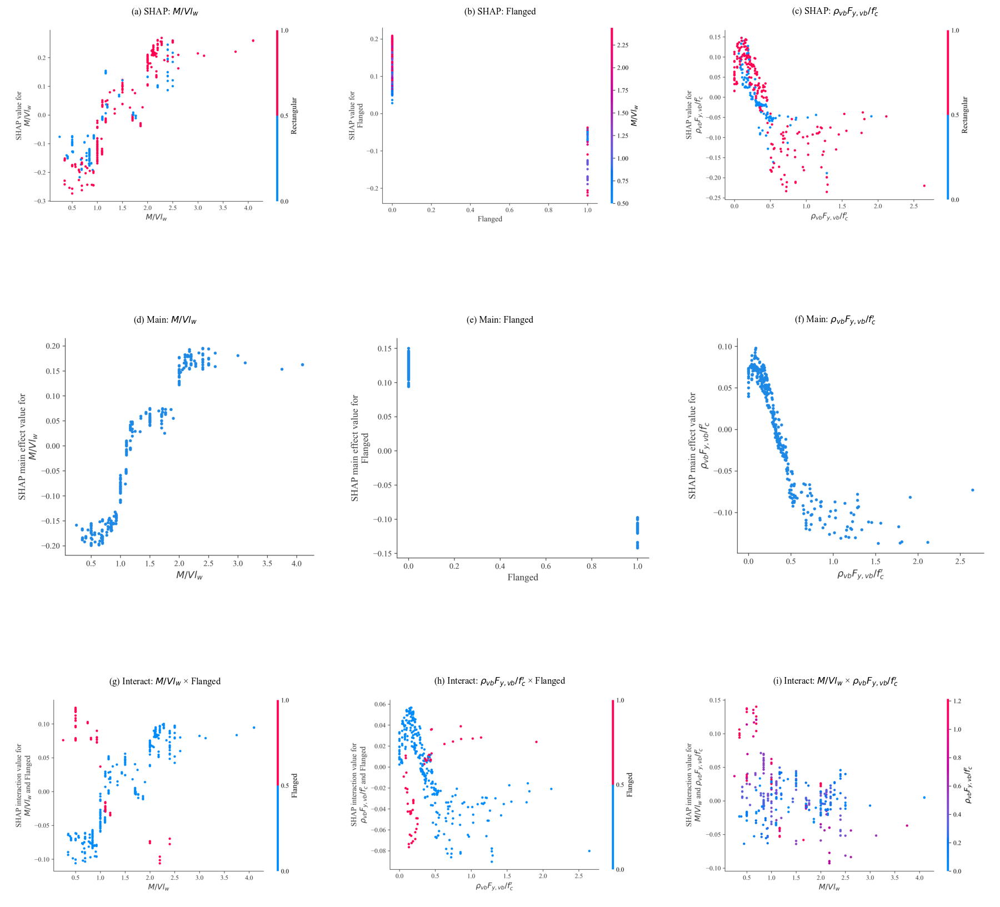

In [330]:
from PIL import Image

for class_name, fileinfo_list in all_meta.items():
    class_dir = f"plots/dependence_per_class/{class_name}"

    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.flatten()

    # Step 1: get size of first middle-row image (row 1, col 0)
    first_middle_img_size = None
    for idx, fileinfo in enumerate(fileinfo_list):
        row = idx // 3
        col = idx % 3
        if row == 1 and col == 0:
            img_path = os.path.join(class_dir, fileinfo["filename"])
            if os.path.exists(img_path):
                img = Image.open(img_path)
                first_middle_img_size = img.size  # (width, height)
            break

    # Step 2: plot images, resize middle row images and pad right side if needed
    for idx, (ax, fileinfo) in enumerate(zip(axes, fileinfo_list)):
        img_path = os.path.join(class_dir, fileinfo["filename"])
        if os.path.exists(img_path):
            img = Image.open(img_path)
            row = idx // 3

            if row == 1 and first_middle_img_size is not None:
                # Resize to height of first middle-row image (keep aspect ratio)
                w, h = img.size
                target_w, target_h = first_middle_img_size
                new_w = int(w * target_h / h)
                img = img.resize((new_w, target_h), Image.LANCZOS)

                # Add padding on right if needed
                if new_w < target_w:
                    padded_img = Image.new('RGB', (target_w, target_h), 'white')
                    padded_img.paste(img, (0, 0))
                    img = padded_img

            ax.imshow(img)
            ax.axis('off')
            ax.set_title(fileinfo["title"], fontsize=12)
        else:
            ax.axis('off')

    plt.savefig(f"{class_dir}/combined_dependence_{class_name}.png", dpi=300)
    plt.show()
    break


## Local SHAP

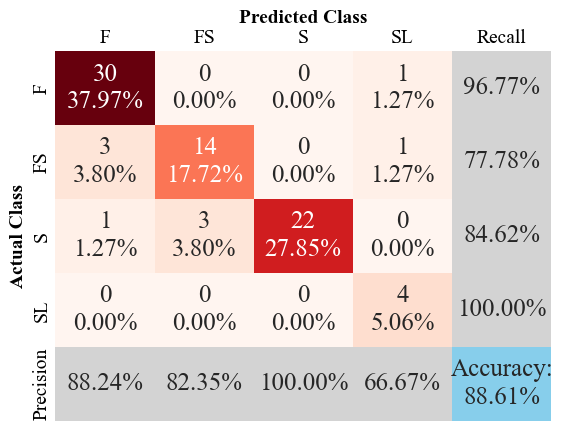

In [155]:
(X_train, y_train, X_test, y_test) = folds_dict['cvae'][0]

y_pred = model_cvae.predict(X_test)
_ = extended_confusion_matrix(y_test, y_pred, class_names=class_names)

In [234]:
indices = np.where((y_test == 0) & (y_pred == 3))[0]
X_test[indices]

array([[-0.5472678 , -0.4681521 ,  0.20283449,  0.72767675,  0.20726769,
         1.1850562 ,  0.25950104, -0.77032804,  0.        ,  0.        ,
         1.        ]], dtype=float32)

In [235]:
X_df = pd.DataFrame(X_test[indices], columns=col_names).rename(columns=rename_dict)
explaination_SL = explainer2(X_df)

X_df = pd.DataFrame(X_test[indices], columns=col_names)
X_df_ori = reverse_numerical(X_df, additional_info)

In [236]:
explaination_SL.data = X_df_ori.values

In [237]:
X_df_ori

,M/Vlw,lw/tw,"ρvwFy,vw/fc","ρhwFy,hw/fc","ρvbFy,vb/fc","ρhbFy,hb/fc",P/fcAg,Ab/Ag,B,F,R
0,1.0,10.625,0.097764,0.12329,0.460971,0.375807,0.094231,5.205767e-10,0.0,0.0,1.0


In [238]:
idxss = np.arange(len(X))
train_idx, test_idx = train_test_split(idxss, test_size=0.2, random_state=0)

# Suppose you're interested in the 13th row of X_test
i = indices[0]
real_index = test_idx[i]
print("Original index in df:", real_index)

# Now access the row in df
original_row = df.iloc[real_index]
print(original_row)

Original index in df: 122
FailureMode           1
M/Vlw               1.0
lw/tw            10.625
ρvwFy,vw/fc    0.097764
ρhwFy,hw/fc     0.12329
ρvbFy,vb/fc    0.460971
ρhbFy,hb/fc    0.375807
P/fcAg         0.094231
Ab/Ag               0.0
Section               R
Name: 122, dtype: object


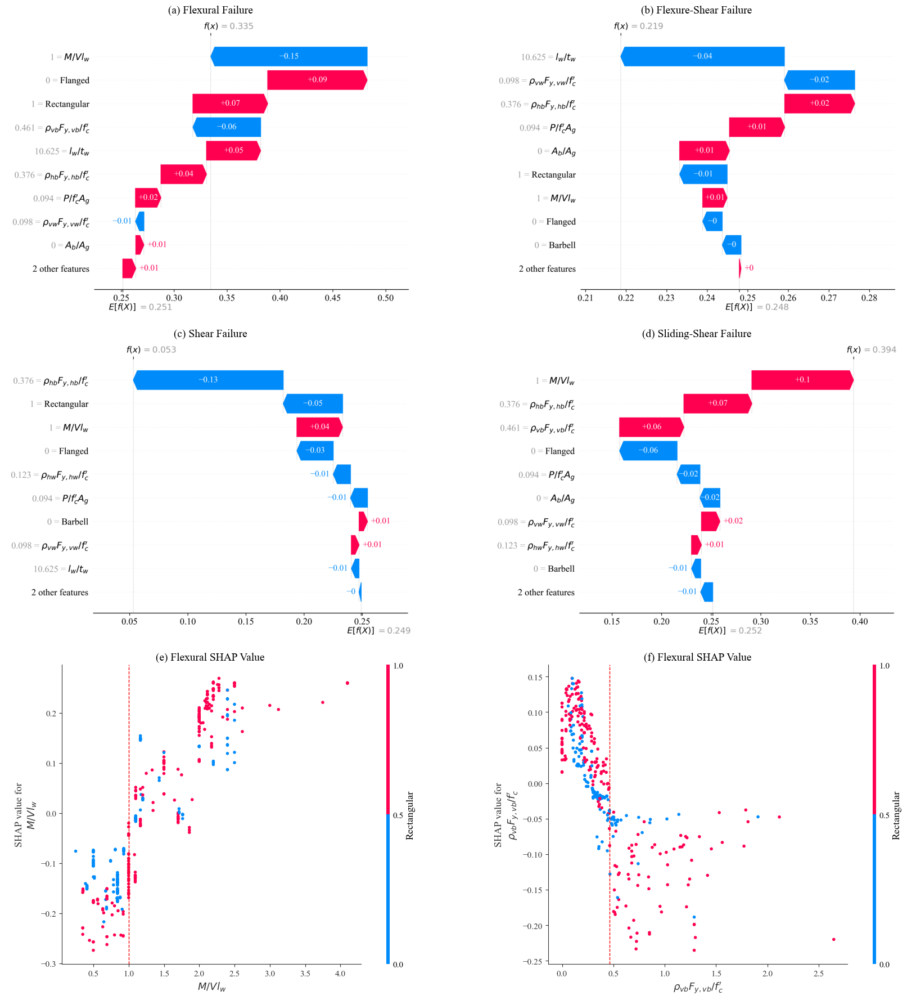

In [353]:
class_names = ["Flexural Failure", "Flexure-Shear Failure", "Shear Failure", "Sliding-Shear Failure"]
filenames = []

plt.close('all')

# Step 1: Generate and save each waterfall plot
for class_idx, class_name in enumerate(class_names):
    shap.waterfall_plot(
        shap_values=explaination_SL[0, :, class_idx],
        max_display=10,
        show=False
    )
    filename = f"plots/waterfall_{class_name}.png"
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.close()
    filenames.append(filename)

# Step 2: Create figure with 3 rows × 2 columns for (a)–(f)
fig, axs = plt.subplots(3, 2, figsize=(18, 18))
axs = axs.flatten()

# Step 3: Load and plot waterfall images (a–d)
for i, filename in enumerate(filenames):
    img = mpimg.imread(filename)
    axs[i].imshow(img)
    axs[i].axis('off')
    letter = string.ascii_lowercase[i]
    axs[i].set_title(f"({letter}) {class_names[i]}", fontsize=14)

# Step 4: Plot SHAP dependence plots as (e) and (f)
shap_dependence_features = [0, 4]  # example: same feature index for comparison
shap_dependence_classes = [0, 0]   # class 0 (F) and class 3 (SL)
shap_value_plot = [1, 0.461]
dependence_titles = ["Flexural SHAP Value ", "Flexural SHAP Value"]

for j in range(2):
    ax_idx = 4 + j  # subplot index for (e), (f)
    plt.sca(axs[ax_idx])  # set current axis
    shap.dependence_plot(
        shap_dependence_features[j],
        shap_values_augmented[..., shap_dependence_classes[j]],
        X_ori,
        feature_names=feature_names,
        ax=axs[ax_idx],
        show=False,
    )
    axs[ax_idx].axvline(x=shap_value_plot[j], color='red', linestyle='--', linewidth=1)
    axs[ax_idx].set_aspect('auto')
    axs[ax_idx].set_box_aspect(1)
    letter = string.ascii_lowercase[ax_idx]
    axs[ax_idx].set_title(f"({letter}) {dependence_titles[j]}", fontsize=14)

# Step 5: Finalize layout and export
plt.tight_layout()
plt.savefig("plots/local_combined.eps", bbox_inches='tight', dpi=300)
plt.savefig("plots/local_combined.tiff", bbox_inches='tight', dpi=300)
plt.show()

# New Data

In [354]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Shear_Wall_Database.xlsx'
df2 = pd.read_excel(file_path, sheet_name='Extra')
df_new=df2.loc[:, 'FailureMode':]
df_new.head()

,FailureMode,M/Vlw,lw/tw,"ρvwFy,vw/fc","ρhwFy,hw/fc","ρvbFy,vb/fc","ρhbFy,hb/fc",P/fcAg,Ab/Ag,Section
0,3,1.25,6.67,0.2794,0.0924,0.9878,0.0000,0.30,0,R
1,3,1.25,6.67,0.2794,0.0924,0.9878,0.0000,0.00,0,R
2,1,1.50,10.00,0.0237,0.1100,0.2253,0.1307,0.28,0,R
3,1,1.50,10.00,0.0263,0.0702,0.2400,0.1076,0.24,0,R
4,1,1.50,10.00,0.0237,0.1100,0.2253,0.1307,0.28,0,R


In [355]:
df_new.groupby('FailureMode').size()

FailureMode
1    10
2     8
3    19
4     1
dtype: int64

In [356]:
print_ranges(df_new)

                 Min       Max
FailureMode        1         4
M/Vlw           0.66       2.5
lw/tw            5.0      12.0
ρvwFy,vw/fc   0.0237    0.2794
ρhwFy,hw/fc  0.02372  0.175479
ρvbFy,vb/fc      0.0  2.510165
ρhbFy,hb/fc      0.0  0.850265
P/fcAg           0.0       0.3
Ab/Ag              0         0
Section            R         R


In [357]:
feature=df_new.loc[:, df_new.columns != 'FailureMode']
output=df_new['FailureMode'] - 1
class_names = ["F", "FS", "S", "SL"]

feature_tensor, label_tensor, *_ = process_dataframe(feature, output, existing_info=additional_info)

## CVAE

In [364]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score
from matplotlib.colors import ListedColormap
import os

FONT_ANNOT = 20
FONT_TITLE = 18
FONT_AXIS = 16
FONT_TICKS = 16
plt.rcParams["font.family"] = 'Times New Roman'

def extended_confusion_matrix(y_true, y_pred, y_mask=None, plot=True, class_names=None, prefix=None, ax=None):
    if class_names is None:
        unique_classes = np.unique(y_true)
        class_names = [f'{i}' for i in unique_classes]
    all_classes = np.arange(len(class_names))
    
    # Compute the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    if y_mask is not None:
        cm_mask = confusion_matrix(y_mask, y_pred)

    # Calculate precision and recall for each class
    precision = precision_score(y_true, y_pred, average=None, labels=all_classes)
    recall = recall_score(y_true, y_pred, average=None, labels=all_classes)
    accuracy = accuracy_score(y_true, y_pred)

    cm = cm.astype(np.float32)
    temp = np.zeros((len(all_classes), len(all_classes)))
    temp[:cm.shape[0], :cm.shape[1]] = cm
    cm = temp
    
    if plot:
        if ax is None:
            fig, ax = plt.subplots(figsize=(8, 6))

        total = np.sum(cm)
        labels = [[f"{val:0.0f}\n{val / total:.2%}" for val in row] for row in cm]
        if y_mask is not None:
            labels[0] = [f"{cm_mask[1][i+1]:0.0f}+{cm_mask[0][i+1]:0.0f} \n{val / total:.2%}" for i, val in enumerate(cm[0])]

        sns.heatmap(cm, annot=labels, cmap='Reds', fmt='',
                    xticklabels=class_names, yticklabels=class_names, cbar=False,
                    annot_kws={"fontsize": FONT_ANNOT}, ax=ax)
        # ax.set_title('Confusion Matrix', fontweight='bold', fontsize=FONT_TITLE)
        ax.tick_params(labeltop=True, labelbottom=False, length=0, labelsize=FONT_TICKS)

        # matrix for the extra column and row
        f_mat = np.zeros((cm.shape[0] + 1, cm.shape[1] + 1))
        f_mat[:-1, -1] = recall
        f_mat[-1, :-1] = precision
        f_mat[-1, -1] = accuracy

        f_mask = np.ones_like(f_mat)
        f_mask[:, -1] = 0
        f_mask[-1, :] = 0

        f_color = np.ones_like(f_mat)
        f_color[-1, -1] = 0

        f_annot = [[f"{val:0.2%}" for val in row] for row in f_mat]
        f_annot[-1][-1] = "Accuracy:\n" + f_annot[-1][-1]

        sns.heatmap(f_color, mask=f_mask, annot=f_annot, fmt='',
                    xticklabels=class_names + ["Recall"],
                    yticklabels=class_names + ["Precision"],
                    cmap=ListedColormap(['skyblue', 'lightgrey']), cbar=False, ax=ax,
                    annot_kws={"fontsize": FONT_ANNOT})

        ax.xaxis.set_label_position('top')
        ax.set_xlabel('Predicted Class', fontweight='bold', fontsize=FONT_AXIS)
        ax.set_ylabel('Actual Class', fontweight='bold', fontsize=FONT_AXIS)

        if prefix is not None:
            os.makedirs("figures", exist_ok=True)
            plt.savefig(f"figures/{prefix}_confusion_matrix.jpeg", dpi=600, bbox_inches='tight')
        
        # Only show plot if ax was not passed (optional)
        if ax is None:
            plt.show()

    return cm, recall, precision, accuracy, ax

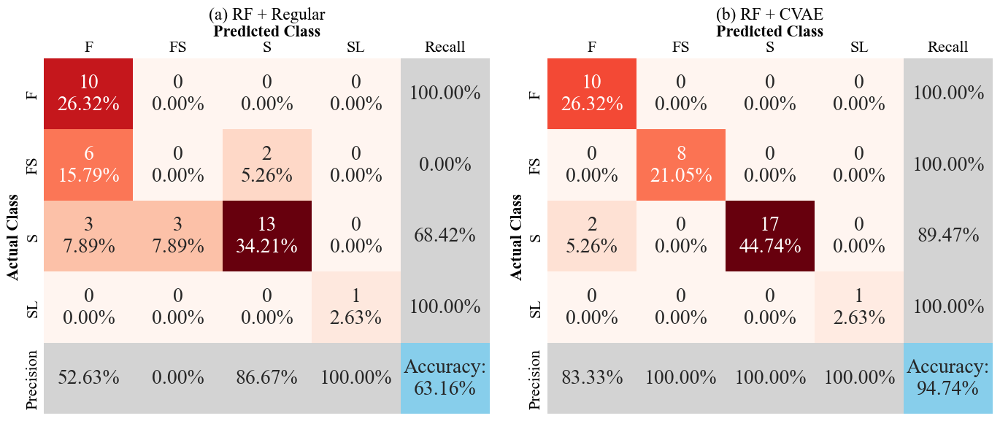

In [366]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# (a) RF+Regular
y_pred = model_regular.predict(feature_tensor)
y_true = np.array(output)
_ = extended_confusion_matrix(y_true, y_pred, class_names=class_names, prefix="extra_data_regular", ax=axes[0])
axes[0].set_title("(a) RF + Regular")

# (b) RF+CVAE
y_pred = model_cvae.predict(feature_tensor)
y_true = np.array(output)
_ = extended_confusion_matrix(y_true, y_pred, class_names=class_names, prefix="extra_data", ax=axes[1])
axes[1].set_title("(b) RF + CVAE")

plt.tight_layout()
plt.savefig(f"plots/new_data_confusion_matrix.tiff", dpi=600, bbox_inches='tight')
plt.savefig(f"plots/new_data_confusion_matrix.eps", dpi=600, bbox_inches='tight')
plt.show()

In [378]:
model_cvae.predict_proba(feature_tensor[33:35,:])

array([[0.75885203, 0.05481849, 0.06577333, 0.12055616],
       [0.75693939, 0.04967021, 0.06971297, 0.12367744]])

In [368]:
df2.loc[y_pred != y_true]

,Unnamed: 0,Author,Specimen,FailureMode,M/Vlw,lw/tw,"ρvwFy,vw/fc","ρhwFy,hw/fc","ρvbFy,vb/fc","ρhbFy,hb/fc",P/fcAg,Ab/Ag,Section
33,34,Baek et al. (2017),NF1T-B,3,1.167,7.5,0.047977,0.035539,0.264764,0.850265,0.07,0,R
34,35,Baek et al. (2017),HF1T-B,3,1.167,7.5,0.050555,0.035860,0.279456,0.763105,0.07,0,R


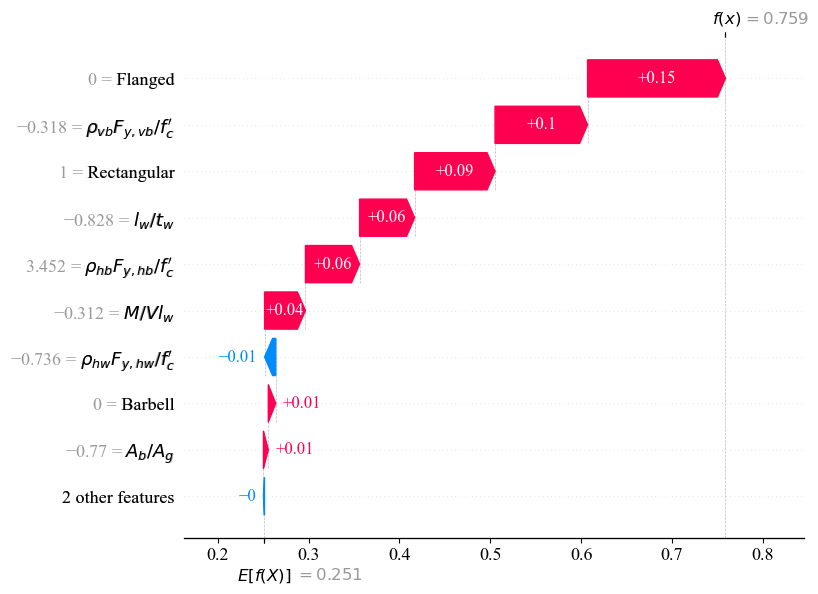

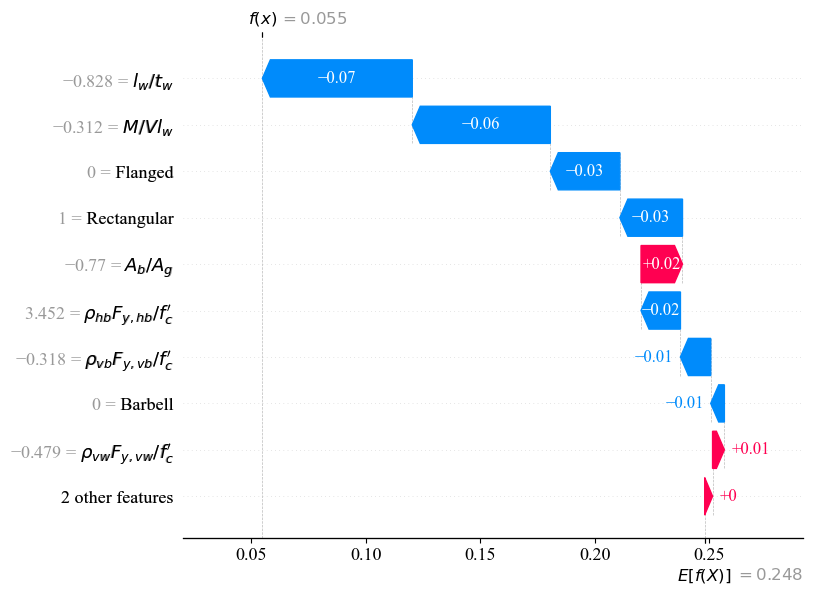

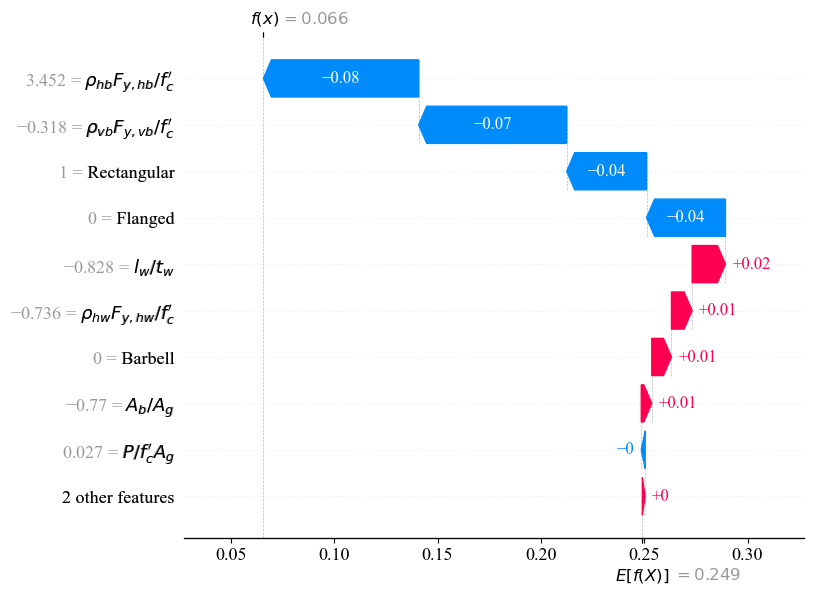

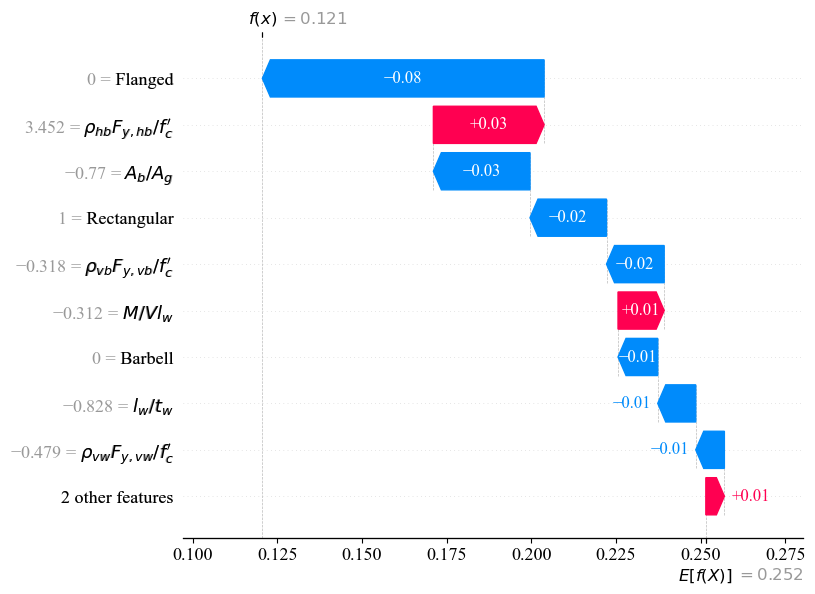

In [373]:
x_new = pd.DataFrame(feature_tensor, columns=col_names).rename(columns=rename_dict)
explaination_new = explainer2(x_new)
for i in range(4):
    shap.waterfall_plot(explaination_new[33,:,i])

## Regular

In [28]:
# train the best model
(X_train, y_train, _, _) = folds_dict['regular'][0]

params = {'n_estimators': 425, 'max_depth': 8, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.25732930753297395}
model = RandomForestClassifier(**params, random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, max_features=0.25732930753297395,
                       n_estimators=425, random_state=42)

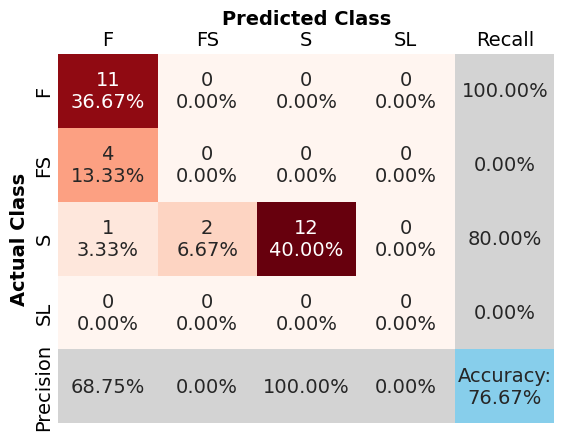

In [29]:
y_pred = model.predict(feature_tensor)
y_true = np.array(output)

_ = extended_confusion_matrix(y_true, y_pred, class_names=class_names, prefix="extra_data_reg")

In [31]:
x = pd.DataFrame(feature_tensor, columns=col_names).rename(columns=rename_dict)

In [32]:
explaination = explainer2(x)

In [36]:
sample_num = 0

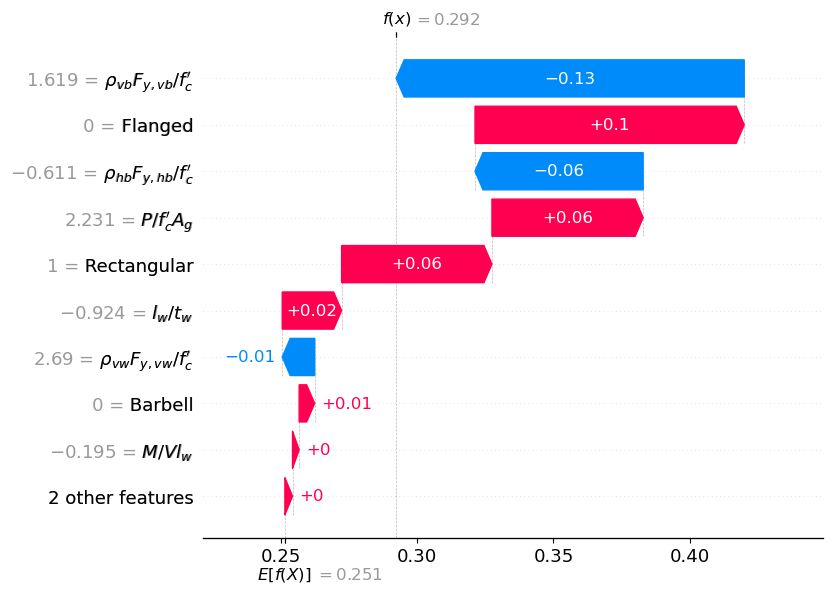

In [37]:
shap.waterfall_plot(explaination[sample_num,:,0])

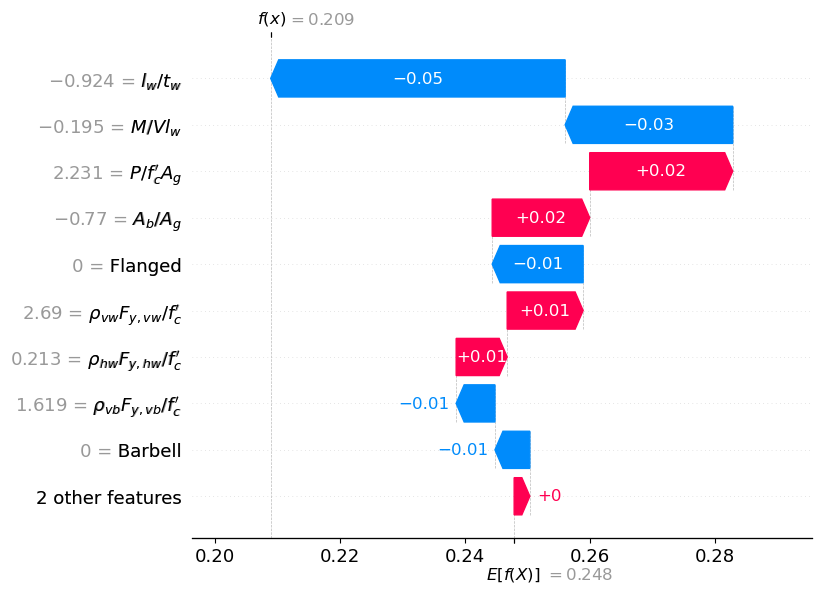

In [38]:
shap.waterfall_plot(explaination[sample_num,:,1])

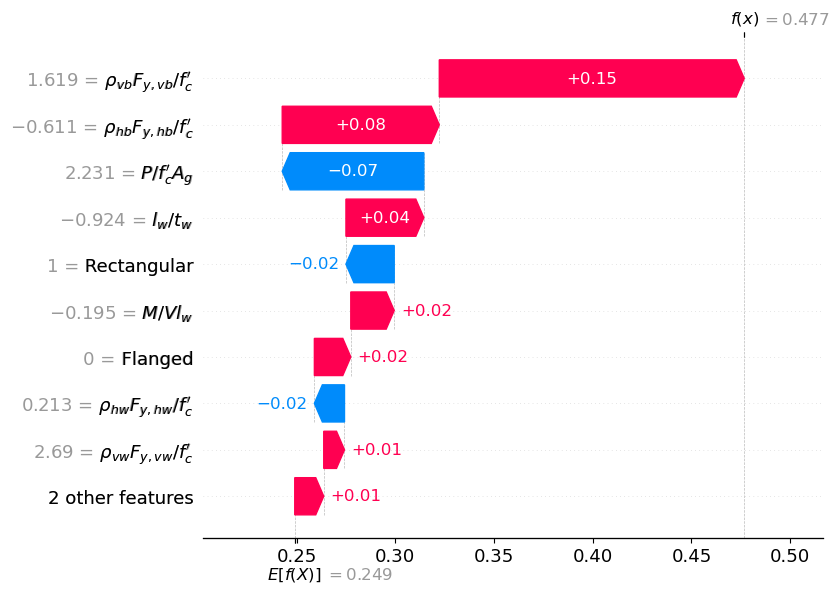

In [39]:
shap.waterfall_plot(explaination[sample_num,:,2])

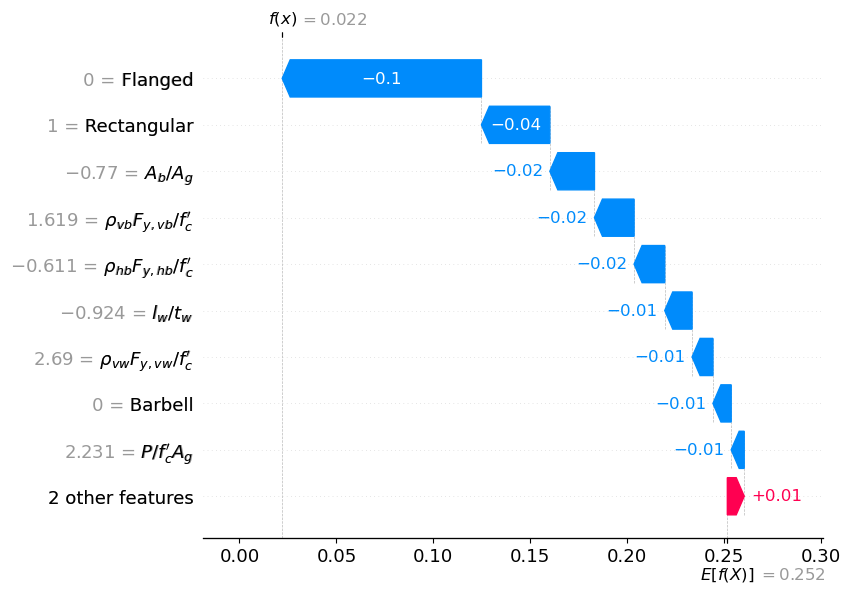

In [40]:
shap.waterfall_plot(explaination[sample_num,:,3])

# RF + CVAE Optimization

In [53]:
(X_train, y_train, X_test, y_test) = folds_dict['cvae'][0]

study_cvae = optuna.create_study(direction="maximize", pruner=optuna.pruners.MedianPruner())  
study_cvae.optimize(lambda trial: objective(trial, "RF", X_train, y_train), n_trials=200, show_progress_bar=True)

(X_train, y_train, X_test, y_test) = folds_dict['regular'][0]

study_regular = optuna.create_study(direction="maximize", pruner=optuna.pruners.MedianPruner())  
study_regular.optimize(lambda trial: objective(trial, "RF", X_train, y_train), n_trials=200, show_progress_bar=True)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

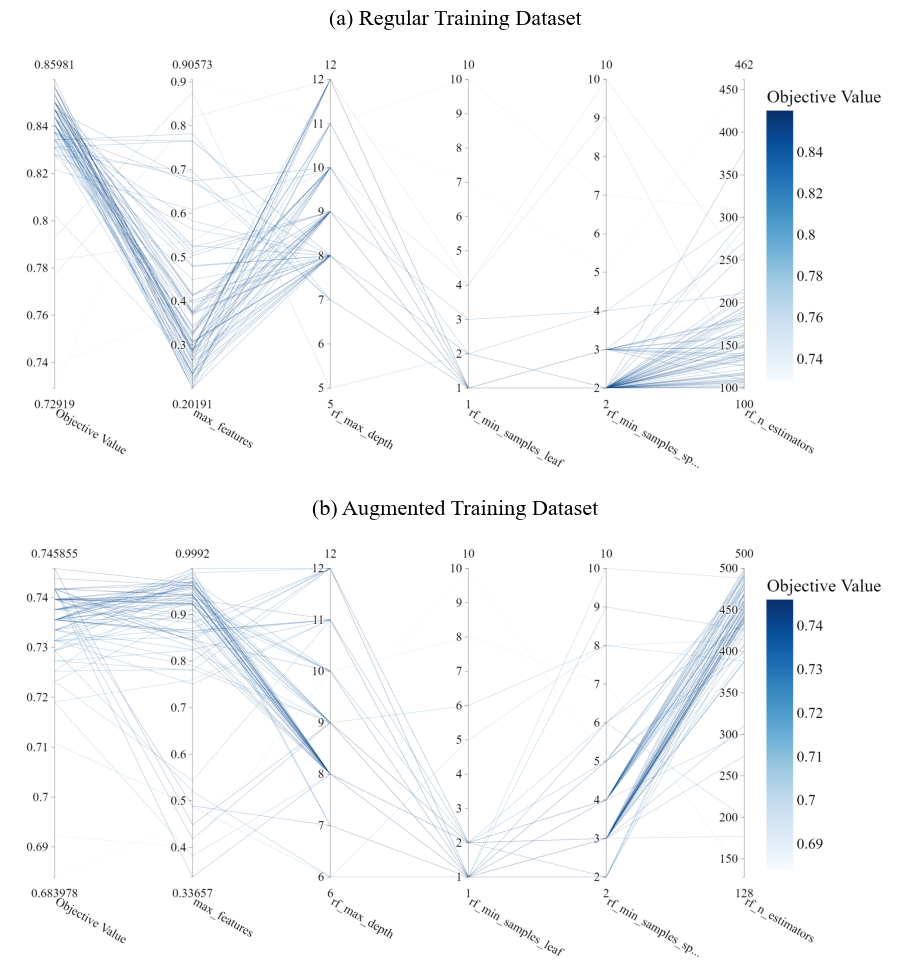

In [54]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Step 1: Generate and save each figure
fig_regular = plot_parallel_coordinate(study_regular)
fig_regular.update_layout(
    template='plotly_white',
    font=dict(
        family="Times New Roman",  # or 'Arial', 'Calibri', etc.
        size=17,                   # increase overall font size
        color='black'              # font color
    ),
    width=1000,
    height=500,
    margin=dict(l=50, r=50, t=50, b=100),
    title=None
)
fig_regular.write_image("plots/parallel_regular.png", scale=3)

fig_aug = plot_parallel_coordinate(study_cvae)
fig_aug.update_layout(
    template='plotly_white',
    font=dict(
        family="Times New Roman",  # or 'Arial', 'Calibri', etc.
        size=17,                   # increase overall font size
        color='black'              # font color
    ),
    width=1000,
    height=500,
    margin=dict(l=50, r=50, t=50, b=100),
    title=None
)     
fig_aug.write_image("plots/parallel_augmented.png", scale=3)

# Step 2: Compose them into a single figure using matplotlib
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# Load and show images
img1 = mpimg.imread("plots/parallel_regular.png")
axes[0].imshow(img1)
axes[0].axis("off")
axes[0].set_title("(a) Regular Training Dataset", fontsize=16, loc='center')

img2 = mpimg.imread("plots/parallel_augmented.png")
axes[1].imshow(img2)
axes[1].axis("off")
axes[1].set_title("(b) Augmented Training Dataset", fontsize=16, loc='center')

plt.tight_layout()
plt.savefig("plots/combined_parallel_plot.tiff", dpi=600, bbox_inches='tight')
plt.savefig("plots/combined_parallel_plot.eps", dpi=600, bbox_inches='tight')
plt.show()

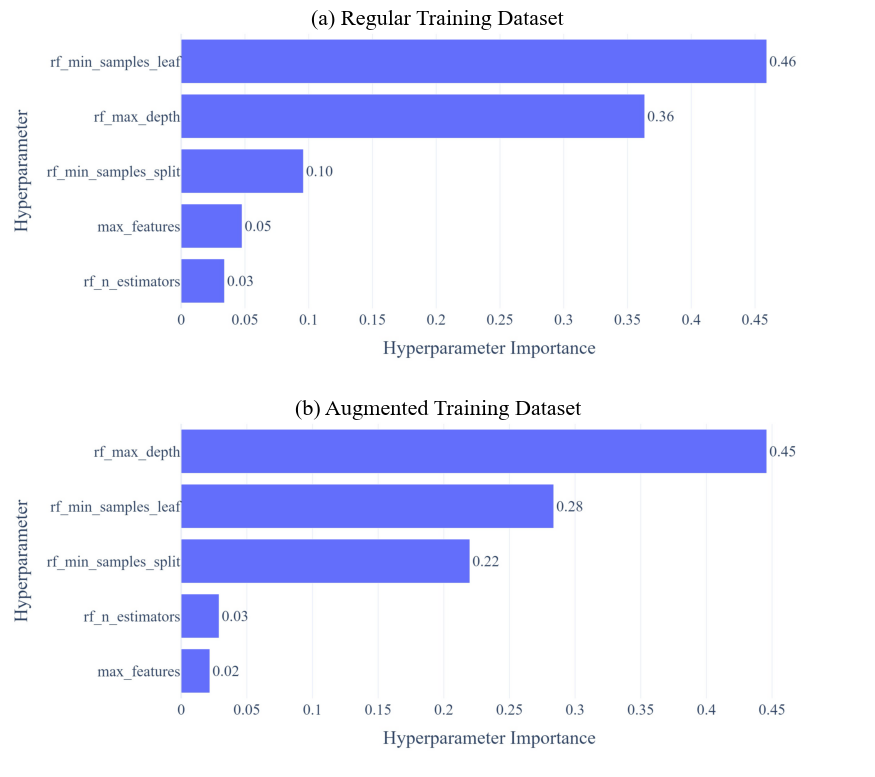

In [77]:
# For study_regular
fig_regular = plot_param_importances(study_regular)
fig_regular.update_layout(
    template='plotly_white',
    font=dict(family='Times New Roman', size=16, color='black'),
    width=800,
    height=600,
    title=None,
)
fig_regular.write_image('plots/param_importance_regular.png', scale=3)

# For study_cvae
fig_aug = plot_param_importances(study_cvae)
fig_aug.update_layout(
    template='plotly_white',
    font=dict(family='Times New Roman', size=16, color='black'),
    width=800,
    height=600,
    title=None,
)
fig_aug.write_image('plots/param_importance_augmented.png', scale=3)

fig, axes = plt.subplots(2, 1, figsize=(12, 8))  # 2 rows, 1 col

# Load images
img1 = mpimg.imread('plots/param_importance_regular.jpeg')
img2 = mpimg.imread('plots/param_importance_augmented.jpeg')

def auto_crop_top_blank(img, threshold=245, padding=10):
    """
    Crops blank rows from the top of an image, keeping a few rows above content.
    
    Parameters:
        img (np.ndarray): Image array (H x W x C)
        threshold (int): Brightness threshold to define "blank"
        padding (int): Number of pixels to preserve above content
        
    Returns:
        np.ndarray: Cropped image
    """
    gray = img.mean(axis=2)
    mask = (gray < threshold).any(axis=1)
    first_content_row = np.argmax(mask)
    
    # Subtract padding, ensure non-negative
    start_row = max(0, first_content_row - padding)
    
    return img[start_row:, :, :]


# Automatically crop blank space from the top
img1_cropped = auto_crop_top_blank(img1)
img2_cropped = auto_crop_top_blank(img2)

# Show images
axes[0].imshow(img1_cropped)
axes[0].axis('off')
axes[0].set_title('(a) Regular Training Dataset', fontsize=16, fontname='Times New Roman')

axes[1].imshow(img2_cropped)
axes[1].axis('off')
axes[1].set_title('(b) Augmented Training Dataset', fontsize=16, fontname='Times New Roman')

plt.tight_layout()
plt.savefig('plots/combined_param_importance.tiff', dpi=600, bbox_inches='tight')
plt.savefig('plots/combined_param_importance.eps', dpi=600, bbox_inches='tight')
plt.show()